# Wavescapes Tutorial

The goal of this tutorial is only to show how you to use the python library; for explanations of the visualization's methodology and how to interpret wavescapes, please refer to [the official publication from Musicae Scientiae](https://www.doi.org/10.1177/10298649211034906)

Before beginning, be sure the module "wavescapes" and all its dependencies are properly installed on your machine or virtual environment ( `pip install wavescapes`). Run the cell below to check if the module was properly installed. 

In [ ]:
import sys
sys.path.append('/'.join(os.getcwd().split('/')[:-1]))


from wavescapes import single_wavescape, all_wavescapes, legend_decomposition

For ease of navigation, here is the table of contents with skiplinks to directly get to the different parts presented in this notebook. If it is your first time with the library, we strongly recommend you follow this notebook in sequential order, reading all markdown cells and running each code cell one after the other.

# Table of Contents

1. [Base cases](#base)
  1. Single wavescape
  2. Analysis window size and its implication on performance
  3. Saving
  4. Visualize one coefficient or many coefficients
  5. Legends (how to read wavescapes colors)
2. [Wavescapes on Audio](#audio)
  1. Audio processing backend & formats supported
  2. Base case
  2. CLP vs. Deep Chroma
  4. Post normalizing
3. [Horizontal and vertical indicators](#ticks)
 1. Horizontal markers
 2. Vertical markers
4. [Highlight & partitioning](#highlights)
 1. Producing “subwavescapes” (zoom-in)
 2. Drawing multiples highlights on wavescapes
5. [Cosmetic changes](#cosmetic)
 1. Adding outlines
 2. Changing primitives
 3. 'True' Opacity
6. [Other parameters](#other)
 1. Adding a wavescape as subplots
 2. Trimming silences
 3. Removing unpitched tracks that are 
 4. Conserve only the hue (phase)
 5. Conserve only the opacity (magnitude)

<a id='base'></a>
# 1. Base cases

The library accepts two types of inputs: symbolic data and real audio data. Symbolic data format supported by the library are MIDI format, or XML/MXL/MusicXML formats. The library acts the same way regardless of the symbolic data format, which is why we only show examples obtained from an MXL file.

All examples in the first part of this notebook are computed from the same input file, which is the _Prelude in C Major_ from J. S. Bach (BWV 846). The version used in this repository comes from this [publicly available transcription in XML format](https://musescore.com/classicman/scores/210606) and is already downloaded and ready to use in the "inputs" folder found in the same directory as this notebook. The line below checks if the file is present and loads its path in the 'bach_prelude_fp' variable.

In [8]:
import os

bach_prelude_fp = 'inputs/Prelude_No._1_BWV_846_in_C_Major.mxl'

if not os.path.isfile(bach_prelude_fp):
    raise Exception("'%s' does not exist."%bach_prelude_fp)

### Single wavescape
The function `single_wavescape` displays a single wavescape and takes three mandatory arguments:

* `filepath`, a string representing the path of the input file.
* `width`, an integer representing the width in pixel of the resulting plot.
* `coefficient`, a positive integer ranging from 1 to 6 which is the Fourier coefficient to be displayed in the plot.

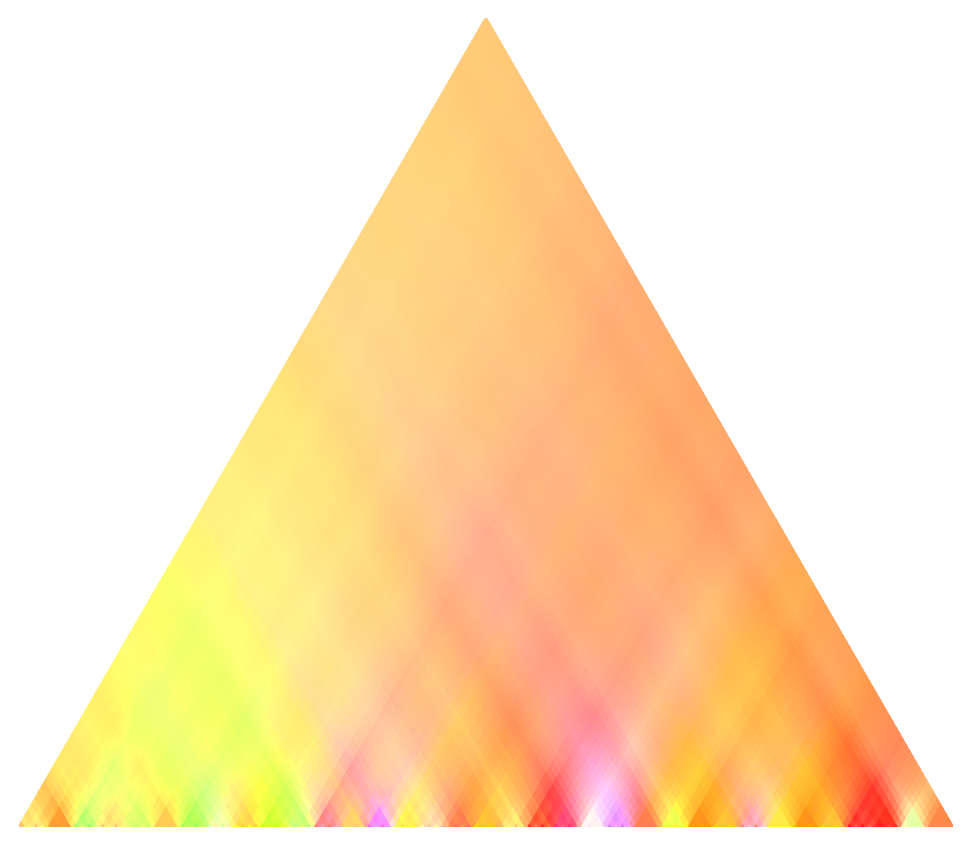

In [3]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5)

### Analysis window size and its implication on performance

Although not mandatory, the parameter `aw_size`, a float, should often be specified as it represents the _size_ of the _analysis window_ which corresponds to the size of the shortest segments of the wavescapes (the ones that fill the bottom-most row). 

The unit of this argument for symbolic data is a quarter note, and by default, is set to 1.0, meaning $N$ non-overlapping segments of quarter notes length segment the input score. The wavescapes feature $ \frac{1}{2}N^2 $ individually drawn elements. This implies `aw_size` **is crucial to the performance of the algorithm, the smaller its value, the sharper the visual plot, however the longer it takes to be generated.**.

The line below generates the wavescape of the fifth coefficient on Bach's Prelude with a width of 700 pixels, and an analysis window's default size of an eight note, you may see how time consuming it is.

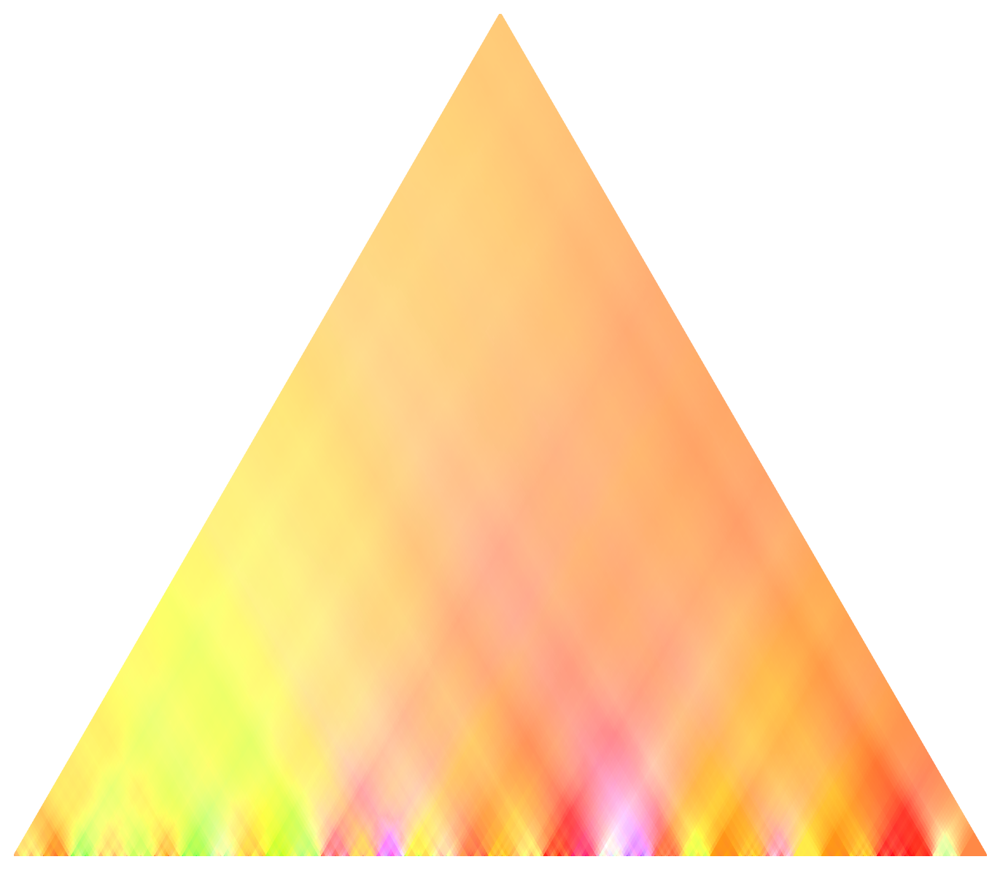

In [4]:
single_wavescape(bach_prelude_fp, width=700, coefficient=5, aw_size=0.5)

To obtain the visual resolution of one color per bar, the value of 4.0 needs to be given to `aw_size`, as the time signature of the Prelude is 4/4, i.e. 4 quarter notes per bar: 

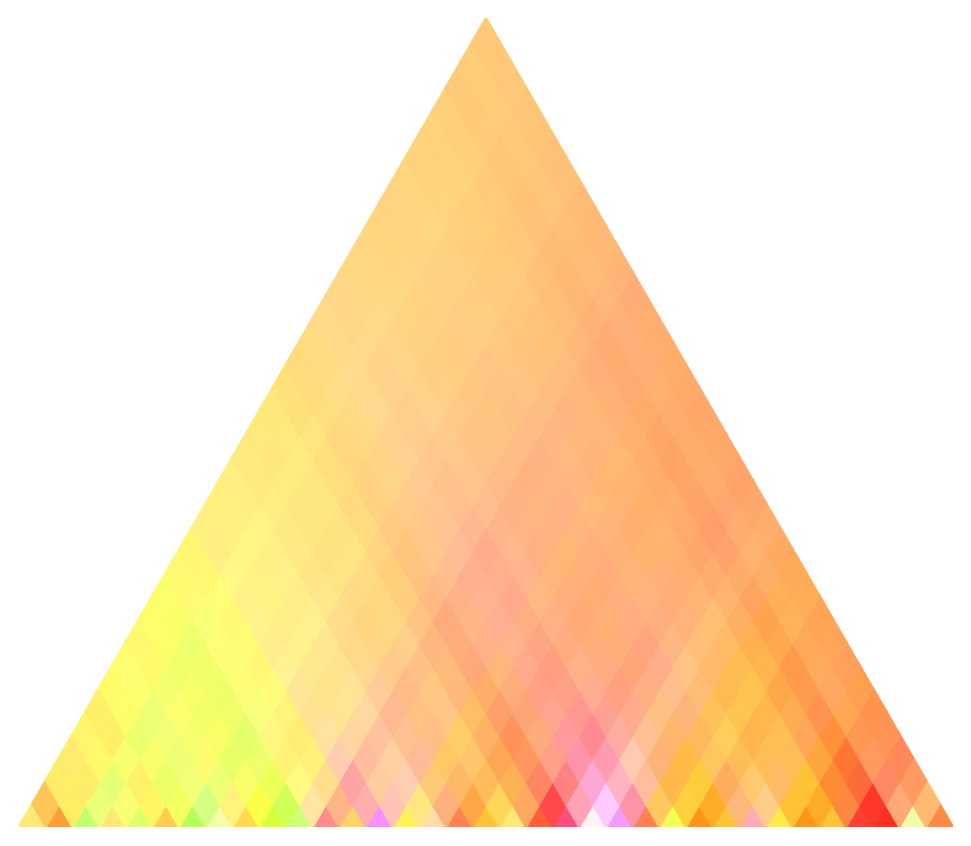

In [5]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5, aw_size=4.0)

### Saving

All visualizations offered by this library are rendered using `matplotlib`, meaning after any call of `single_wavescape`, the `matplotlib.pyplot.savefig('<filename>.<format>')` function can be used in order to save the plot into any of the image formats supported by matplotlib.

However, `single_wavescape` provides a `save_label` parameter that achieves the same result in order to keep everything self-contained.

```python
#this would saves the plot under the filename 'bache_prelude_5th.png' in the same foldera as this notebook
single_wavescape(bach_prelude_fp, coefficient=5, width=500, save_label='bache_prelude_5th.png')

```

### Visualize one coefficient or many coefficients
Generally it is useful to observe more coefficients at once which is possible by calling many times the function `single_wavescape` with different values for `coefficient`. We recommend to label which coefficient is visualized on the top left corner, which can be done by providing a `string` value through the `label` parameter. `label_size` can be used to control the size of the font:

In [9]:
single_wavescape(bach_prelude_fp, width=500, coefficient=4, aw_size=4, label='4th coeff.')
# changing the font size of the label to 10, the default size is around 18
single_wavescape(bach_prelude_fp, width=500, coefficient=3, aw_size=4, label='3rd coeff.', label_size=10)

NameError: name 'single_wavescape' is not defined

If you wish to visualize all coefficients at once in a single figure, you can use the function `all_wavescapes`. It functions similarly to `single_wavescape`, and takes only two mandatory argument:

* `filepath`, a string representing the path of the input file.
* `individual_width`, an integer representing the width in pixel of one of the six wavescapes outputted. As the plot produced from this function places thee wavescapes on a grid of three columns and two rows, the resulting figure is roughly three times as wide as `individual_width`, and roughly twice as tall.

All other parameters from this function are shared with `single_wavescape` with the exception of `coefficient`, `label` and `ax` which will be introduced later on.  

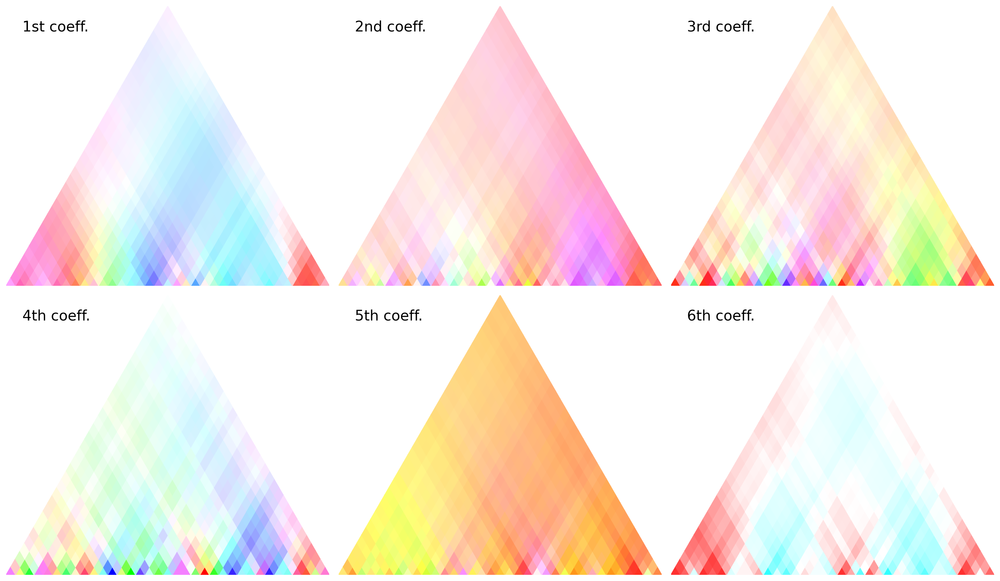

In [7]:
all_wavescapes(bach_prelude_fp, individual_width=500, aw_size=4)

<a id='legend'></a>
### Legends (how to read wavescapes colors)

Without knowledge of the hue function used for the color mapping, it is hard to decipher the colors in wavescapes. For instance, the C major triad projects a blue hue in the fourth coefficient, while projecting an orange hue in the second coefficient. 

Thus, the library provides a function called `legend_decomposition` that can render legends for wavescapes by displaying position of musical structure on the color space from the wavescapes. Below is a code snippet using the function to generate the color space itself:

/Users/cedricviaccoz/wavescapes/notebooks/wavescapes/general.py:342: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['$0$', '', '$\pi/2$', '', '$\pi$', '', '$3\pi/2$', ''])


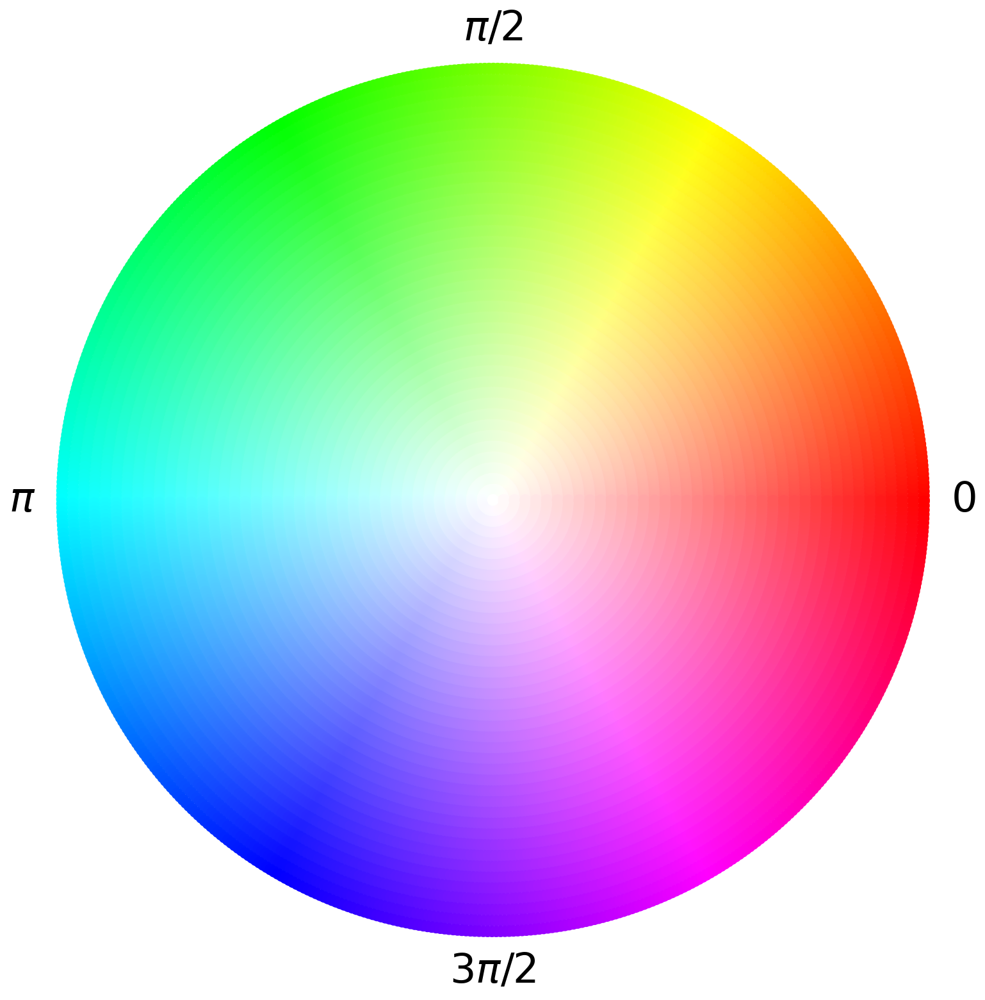

In [8]:
legend_decomposition({}, single_img_coeff=1)

This is how the color space used in wavescapes looks like when it is projected on a polar space, the phase and magnitudes corresponding to the polar coordinates.

This function displays the position of any musical structure you wish through a python dict. Each entry of the dictionary needs to be defining following this structure:

`{label: (PCV, coeffs)}`

* `label` the string label of the musical structure to be displayed on the plot.

* `PCV` is a 12 dimensional vector of float/integer values that represent the musical structure. The first value (`PCV[0]`) represents the weight of the C pitch class, the second value (`PCV[1]`) represents the weight of the C# pitch class, and so forth until B (`PCV[11]`). For instance, A C major triad with equal weights in PCV fashion is expressed by the value `[1,0,0,0,1,0,0,1,0,0,0,0]`

* `coeffs` is an array/list of variable length holding the set of coefficients through which the musical structure represented by `PCV` has to be visualized. The value `[5,6]` means we want to see the position in the color space of `PCV` for the 5th and the 6th coefficient. 


The legend function has only one mandatory parameter which is this dict. For instance, if we want to observe the placement in the color space of the C Major triad in the 3rd, 4th and 5th coefficient, the following dict can be provided to `legend_decomposition`

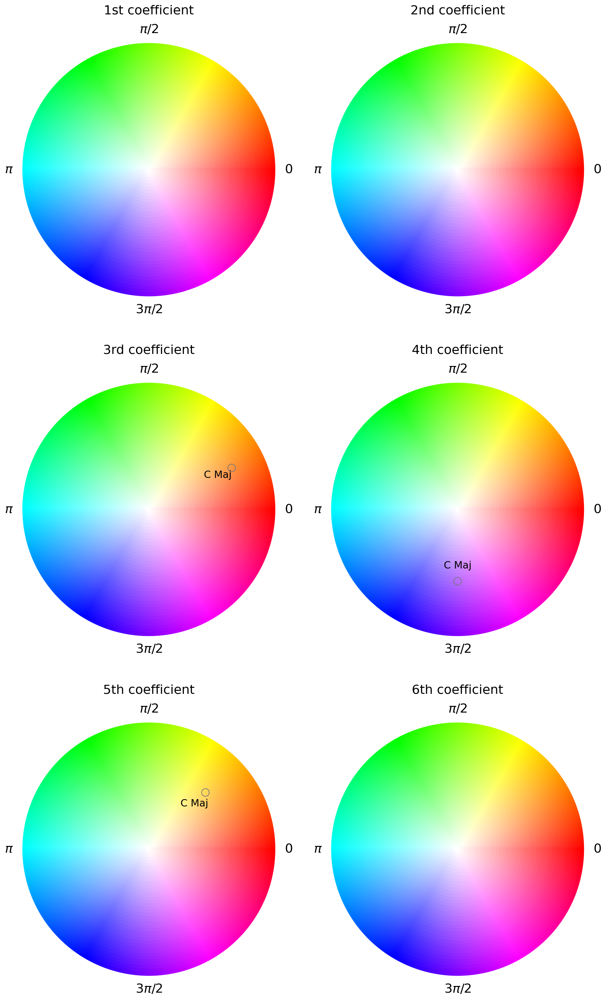

In [9]:
d = {'C Maj': ([1,0,0,0,1,0,0,1,0,0,0,0], [3,4,5])}
legend_decomposition(d)

To observe more than one musical structure at a time, more entries can be provided to the input dict. Furthermore, if you want to observe the position of a musical structure on all coefficients without the hassle of writing down each coefficient number, you can simply provide the value `[0]` for the `coeffs` part of the dict entry.

Let's say we want to observe the position on all coefficients of the C augmented triad, and the D minor seventh chord, but we want to observe the position of the C Major diatonic scale only on the 5th coefficient:

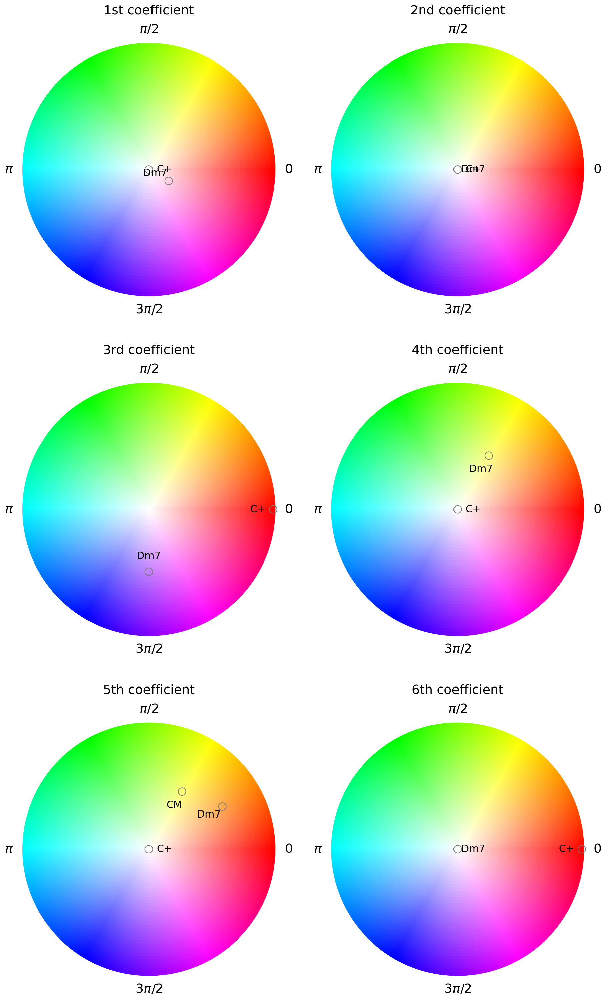

In [10]:
d = {'C+': ([1,0,0,0,1,0,0,0,1,0,0,0], [0]),
     'Dm7': ([1,0,1,0,0,1,0,0,0,1,0,0], [0]),
     'CM': ([1,0,1,0,1,1,0,1,0,1,0,1], [5])}
legend_decomposition(d)

Now, let's say we are interested only by the fifth coefficient, and don't want to render the color space for the other coefficients. This can be done by providing the number of the coefficient to isolate to the parameter `single_image_coeff`:

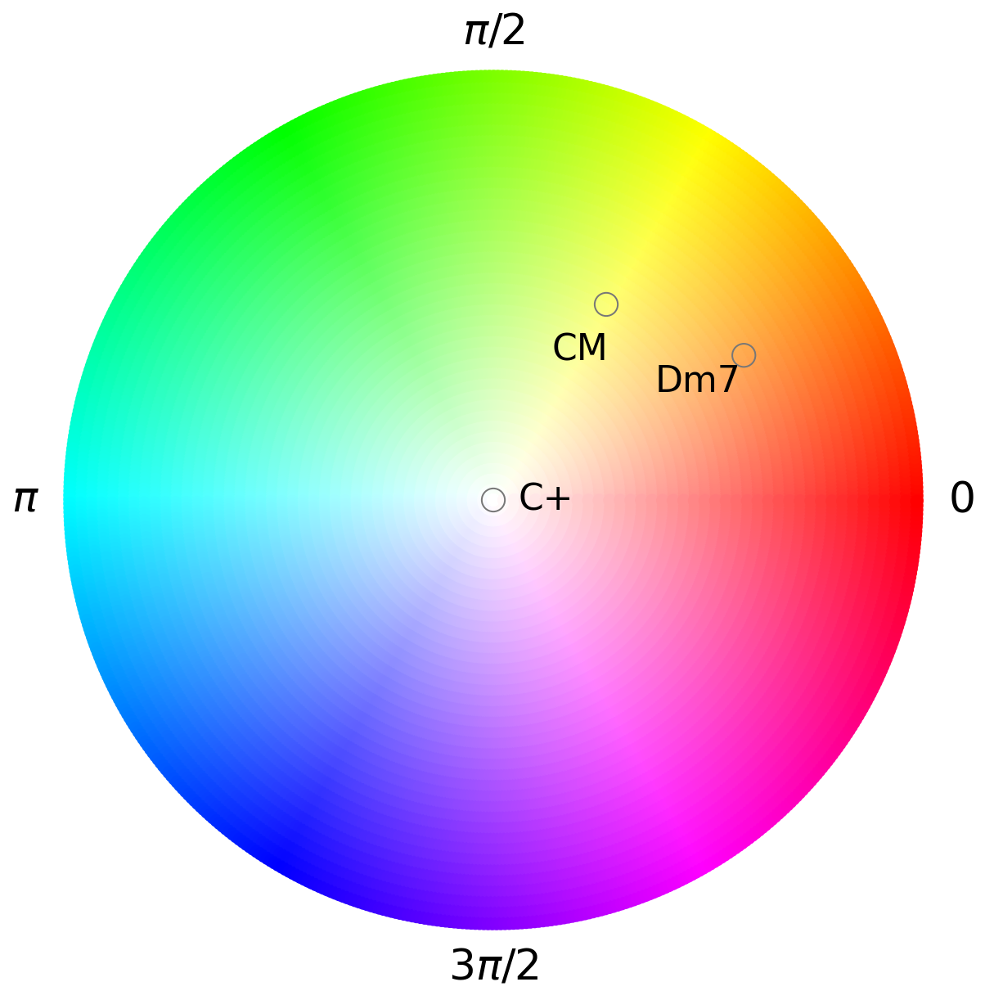

In [11]:
d = {'C+': ([1,0,0,0,1,0,0,0,1,0,0,0], [0]),
     'Dm7': ([1,0,1,0,0,1,0,0,0,1,0,0], [0]),
     'CM': ([1,0,1,0,1,1,0,1,0,1,0,1], [5]),}

legend_decomposition(d, single_img_coeff=5, width=10)

Finally, note that the parameter `width` can be used to specify the width of the legend in inches.

<a id='audio'></a>
# 2. Wavescapes on Audio

Through this section, two audio files are used to demonstrate wavescapes on audio data. They are accompanied by two corresponding XML transcriptions acting as reference points to judge the performance of the audio processing. The two pieces chosen are:

1. [A string quartet recording](https://imslp.org/wiki/Special:ReverseLookup/84547) by the "Steve's Bedroom Band" of the first of the two Arabesques by Claude Debussy (L. 66) made publicly available under the Creative Common Attribution 3.0 License. Its [XML counterpart can be found here](https://musescore.com/classicman/scores/55396), however it has been transposed to the key of F Major so that it shares the tonality of the audio recording.
2. [An orchestral recording](https://imslp.org/wiki/Special:ReverseLookup/246990) by the "Czech National Symphony Orchestra" of the fourth movement of the Peer Gynt Suite No. 1 Op.46 by Edvard Grieg (which is more commonly known in the pop culture under the name "In the Hall of the Mountain King") made publicly available under the Creative Common Attribution 3.0 License. Its [XML counterpart can be found here](https://musescore.com/user/1580161/scores/4836471).


In [12]:
import os

def test_file_existence(filepath):
    if not os.path.isfile(filepath):
        raise Exception("'%s' does not exist."%filepath)

arabesque_audio = 'inputs/IMSLP84547-PMLP02383-T02_debussy_arabesque.mp3'
arabesque_xml = 'inputs/Arabesque_L._66_No._1_in_F_Major.musicxml'
mk_audio = 'inputs/IMSLP246990-PMLP02533-Peer_Gynt_Suite_No._1,_Op._46_-_IV._In_the_Hall_Of_The_Mountain_King.mp3'
mk_xml = 'inputs/In_the_Hall_of_the_Mountain_King.mxl'

for f in [arabesque_audio, arabesque_xml, mk_audio, mk_xml]:
    test_file_existence(f)

When it comes to producing wavescapes, the main difference between audio and symbolic data is the way pitch-class content is retrieved from the input. This process is trivial for symbolic data, but quite complex for audio, and as such, it deserves a bit of explanation: 

### Audio processing backend & formats supported

The`wavescapes` library uses the [madmom](https://github.com/CPJKU/madmom) python library as its audio backend. `madmom` is only used to retrieve pitch-class vectors (or chromagrams) from the audio signal. By default, `madmom` natively support audio files in WAV format, but almost all existing audio formats can be supported if [ffmpeg](https://ffmpeg.org/) is properly installed on your machine. **As the two audio files used in this tutorial are in `mp3`, `ffmpeg` is required for running the following cells from this section**. 


### Base case

Pitch-class vectors are used to build the wavescape without any consideration of their source, whether its from symbolic or audio data. As such, with the exception of `removing_unpitched_tracks`, all parameters introduced previously work the same way on audio input.

Performing wavescape on audio is pretty simple, by providing the path of an audio file to the `single_wavescape` function, the library checks the file extension to decide whether to process audio or symbolic data. The cell below generates the wavescapes on the 5th coefficient on the quartet recording of Debussy's Arabesque:

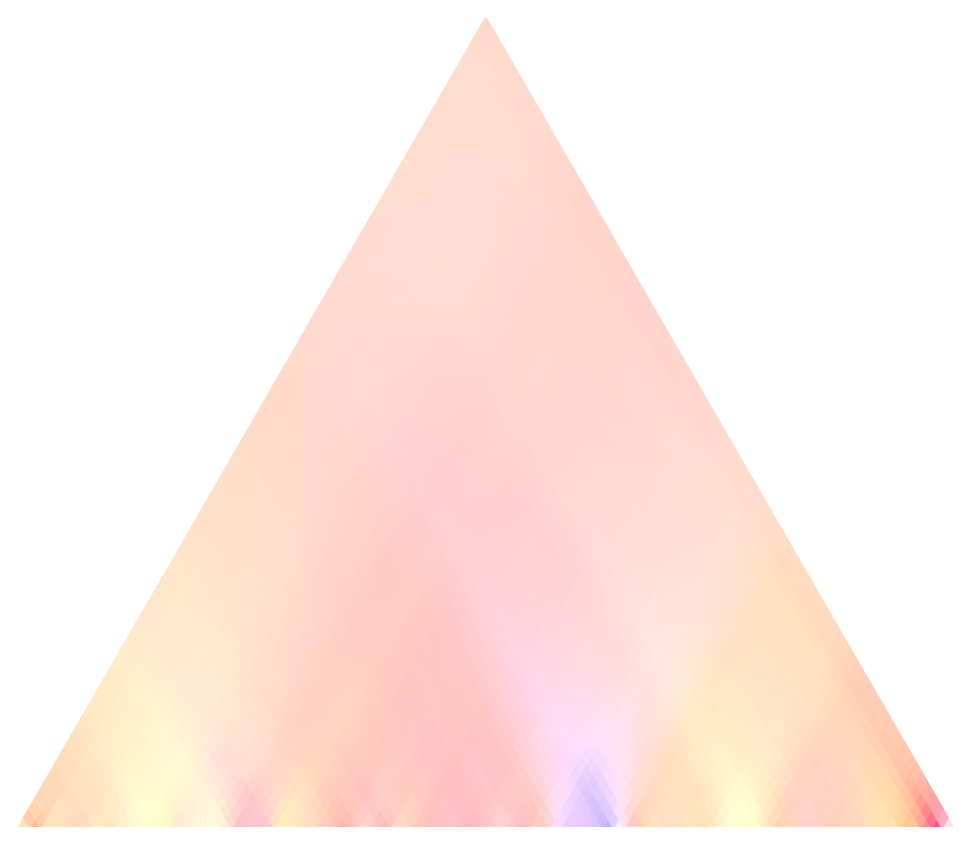

In [13]:
single_wavescape(arabesque_audio, 500, coefficient=5,  aw_size=3)

The argument `aw_size` still holds the function of representing the length of the shortest segment of the wavescape, but its unit is expressed in seconds instead of quarter notes. This means, in the example above, consecutive segments of 3 seconds of recording were extracted.

Although the plot produced is readable, the colors are quite faded away. Without knowledge of the tonality of the piece, it is hard to know whether the color appears faded because the tonality of the piece does not resonate well with Fourier's 5th coefficient, or because the chromagram production process had trouble extracting the relevant pitch content. 

Fortunately, we can use the XML transcript as a way to check the accuracy of the audio processing, below is a function that displays wavescapes from symbolic and audio data side by side:

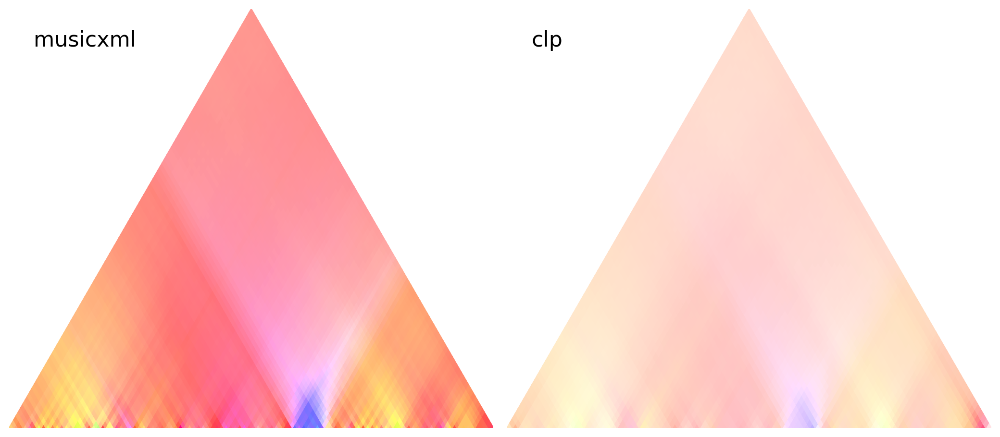

In [14]:
import matplotlib.pyplot as plt
#aw size choseon so both files are cuts in roughly 100 segments
arabesque_xml_aw = 4 #106.1 bars * 4 == 425 quarter notes in length
arabesque_mp3_aw = 3 #4:21 == 261s

def symbolic_vs_audio(sym_fp:str, audio_fp:str, sym_aw:float, audio_aw:float, indiv_width:int,
                      coefficient:int, deep_chroma:bool=False, pn:bool=False):
    dpi = 96
    total_width = (2.1*indiv_width)/dpi
    #height compute_plot_height
    sym_label = sym_fp.split('.')[-1]
    audio_label = ('dc' if deep_chroma else 'clp') + ('_pn' if pn else '')
    fig = plt.figure(figsize=(total_width, indiv_width/dpi), dpi=dpi)
    
    ax1 = fig.add_subplot(1,2,1, aspect='equal')
    single_wavescape(sym_fp, indiv_width, coefficient=coefficient, aw_size=sym_aw, ax=ax1, label=sym_label)
    
    magn_stra = 'post_norm' if pn else '0c'
    ax2 = fig.add_subplot(1,2,2, aspect='equal')
    single_wavescape(audio_fp, indiv_width, coefficient=coefficient, aw_size=audio_aw, ax=ax2, label=audio_label, deep_chroma=deep_chroma, magn_stra=magn_stra)

symbolic_vs_audio(arabesque_xml, arabesque_audio, arabesque_xml_aw, arabesque_mp3_aw, 500, 5)

Although the hue seems to be generally consistent between the two versions of the Arabesque, we can confirm how the lack of opacity seems to be an issue stemming from audio processing.

### CLP vs Deep Chroma

Two methods of chromagrams retrieval proposed by madmom are implemented in the wavescapes library:

1. The **Compression Log Pitch (CLP)** Chroma Processor (default one)
2. The **Deep Chroma** Processor

By default, the CLP Chroma Processor is used, the previous audio plots were produced through this process. The Deep Chroma Processor uses a pre-trained deep neural network to help extract harmonic features from an audio signal ([more info about that on the official paper](https://arxiv.org/abs/1612.05065)). To switch from the CLP to the Deep Chroma processor, the boolean parameter `deep_chroma` from `single_wavescape` can be set to the value `True`. Here is how the visual result changes by enabling the deep chroma processor on the previous example:

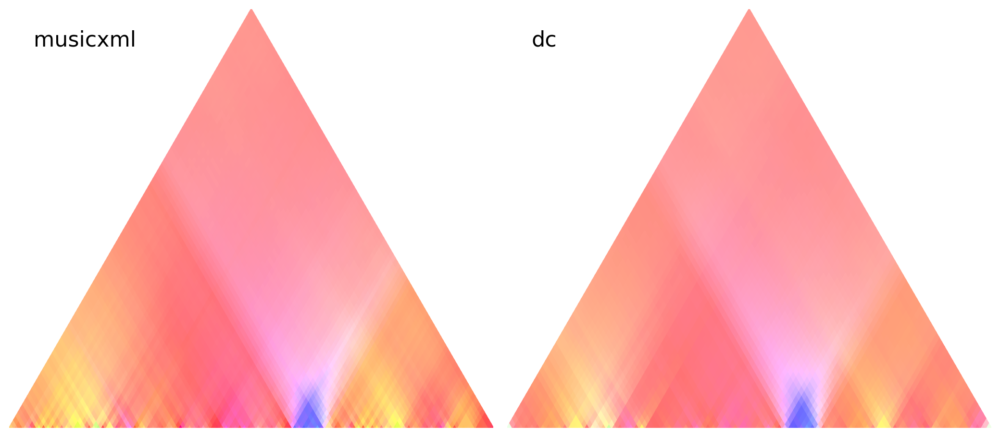

In [15]:
symbolic_vs_audio(arabesque_xml, arabesque_audio, arabesque_xml_aw, arabesque_mp3_aw, 500, 5, deep_chroma=True)

The visual quality is better, even comparable to the quality achieved on symbolic data. Often the Deep Chroma processor performs better than the CLP, although it varies depending on the input. Generally, the Deep Chroma performs the best on pieces with percussions, such as "In the hall of the mountain King":

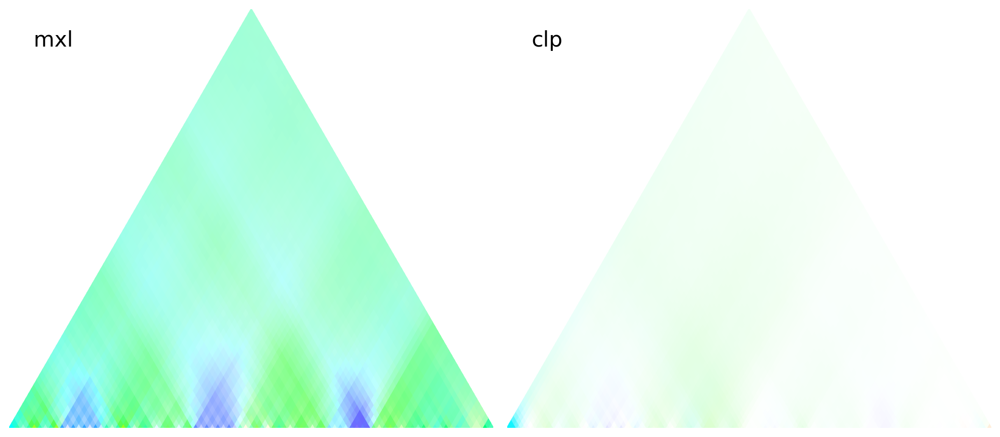

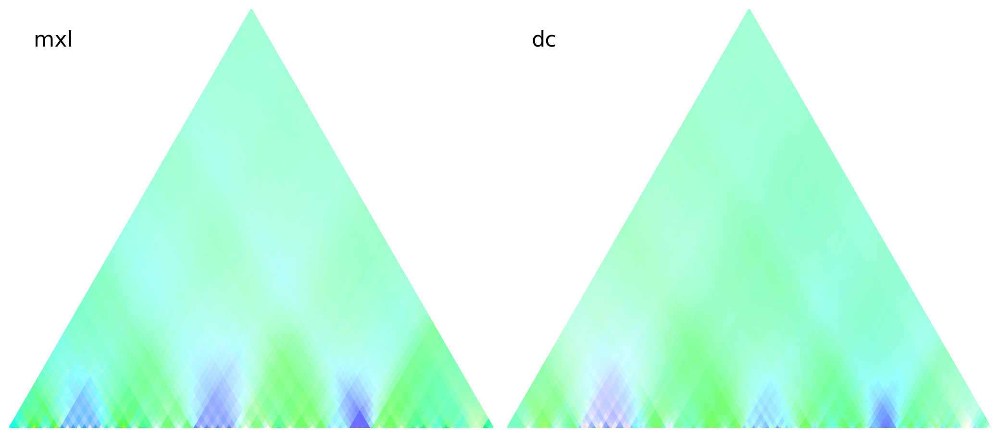

In [16]:
mk_xml_aw = 4 #87 bars * 4 == 348 quarter notes in length
mk_mp3_aw = 1.5 #2:34 == 154s
symbolic_vs_audio(mk_xml, mk_audio, mk_xml_aw, mk_mp3_aw, 500, 5)
symbolic_vs_audio(mk_xml, mk_audio, mk_xml_aw, mk_mp3_aw, 500, 5, deep_chroma=True)

For this piece, the CLP method is practically fruitless while the Deep Chroma processor brings the visual quality close to the MXL version. The quality can still be increased through one last trick:

### Post normalizing

Even through the wonders of the Deep Chroma processor, it is unlikely that a pitch-class vector derived from audio data can actually reach a normalized magnitude value of 1 (which visually corresponds to the maximum possible opacity) for any of the coefficients. However, any wavescapes on audio has at least one element reaching a maximum value of normalized magnitude,$\mu_m$, such that $0 \leq \mu_m \lt 1$. This implies that all the opacity values corresponding to magnitudes above this maximum are not "used" in the plot. What we call 'post normalizing' is setting this maximum observed value of magnitude to the maximal opacity instead, all magnitudes are multiplied by a factor of $\frac{1}{\mu_m}$. This means the maximum opacity is reached by at least one of the elements from the wavescape (the one with value $\mu_m$, since $\frac{1}{\mu_m} * \mu_m = 1$).

The parameter `magn_stra` from `single_wavescape` represents the _magnitude_ _strategy_ for wavescapes and can receive different string parameters. For now, we are interested only by two of them, `0c` (the default one, stands for '0th coefficient') and `post_norm`, which achieves the process of normalizing the magnitude as described previously:

Max magnitude of 0.598082 observed for coeff. number 5, post normalizing all magnitudes by 167.20% of their original values


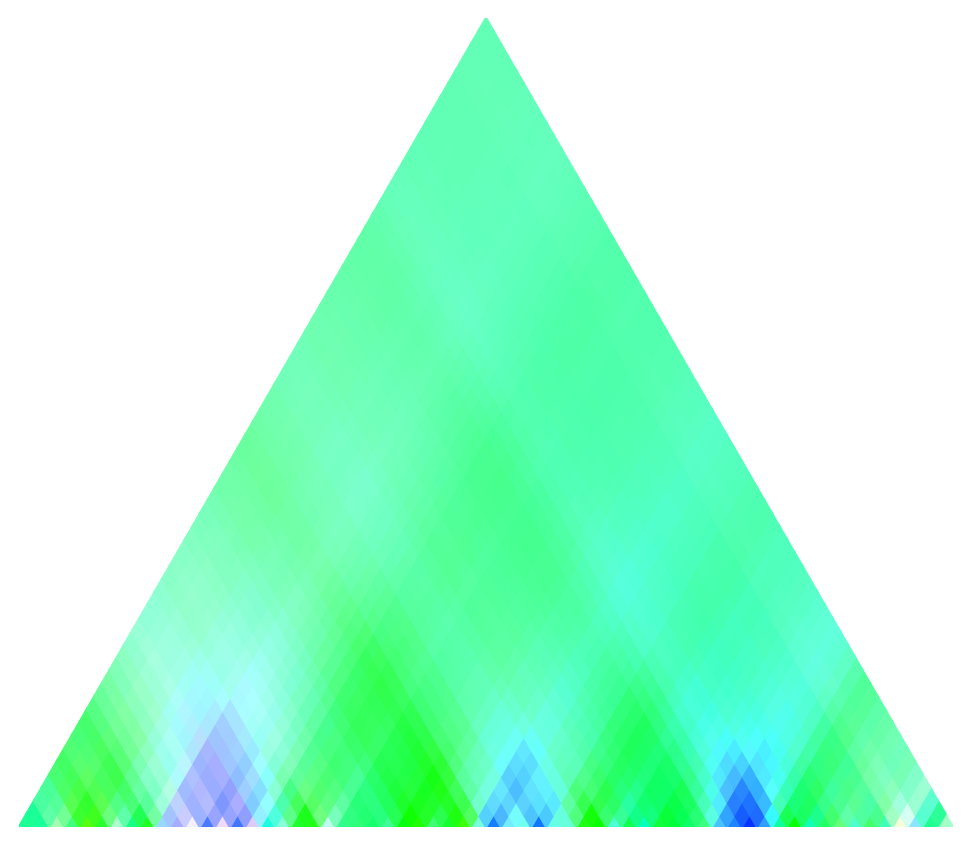

In [17]:
single_wavescape(mk_audio, 500, coefficient=5,  aw_size=2.5, magn_stra='post_norm', deep_chroma=True)

The CLP version can also be "post-normalized":

Max magnitude of 0.915704 observed for coeff. number 5, post normalizing all magnitudes by 109.21% of their original values


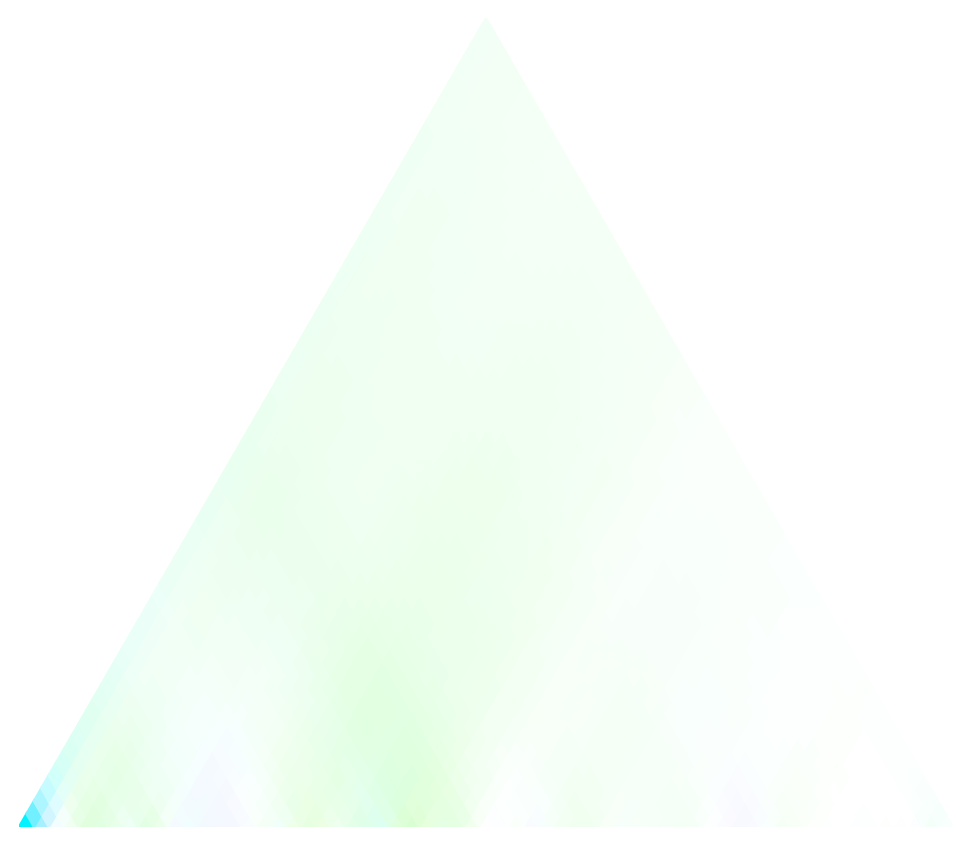

In [18]:
single_wavescape(mk_audio, 500, coefficient=5,  aw_size=2.5, magn_stra='post_norm', deep_chroma=False)

As the maximal magnitude is already close to 1, post normalization does not improve the visual quality by much.

Although post normalizing the wavescapes by default sound be tempting, this is a process that fundamentally alters the perception we have of the tonality of pieces read through wavescapes, and as such, should be used on audio data only when it is not possible to obtain readable visual results otherwise. For instance, using "post normalizing" on the deep chroma processed Arabesque actually "overdrives" the color values:

Max magnitude of 0.628007 observed for coeff. number 5, post normalizing all magnitudes by 159.23% of their original values


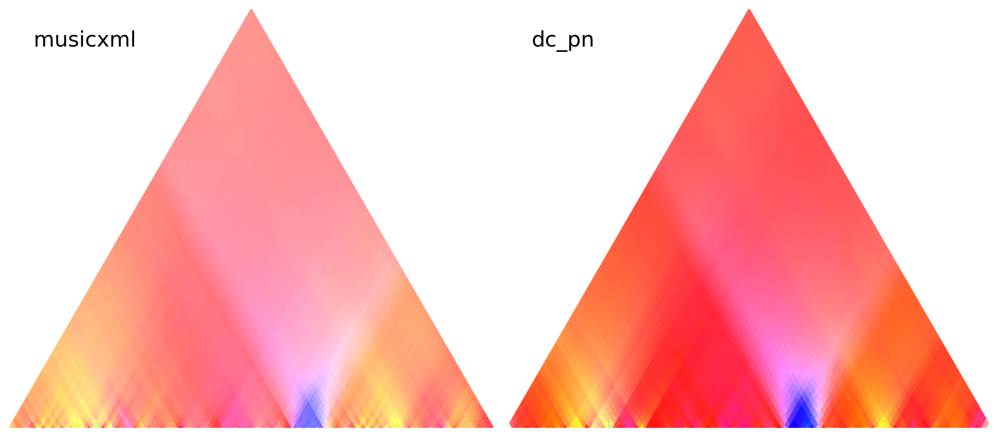

In [19]:
symbolic_vs_audio(arabesque_xml, arabesque_audio, arabesque_xml_aw, arabesque_mp3_aw, 500, 5,\
                  deep_chroma=True, pn=True)

The fact that the colors do not reach the maximal opacity value on the reference XML transcription is actually an information about the tonality of the Arabesque; an information that gets lost when post normalization is used on the deep chroma processed audio. However, using it on the CLP processed audio actually brings its visual quality a bit closer to the reference figure:

Max magnitude of 0.661403 observed for coeff. number 5, post normalizing all magnitudes by 151.19% of their original values


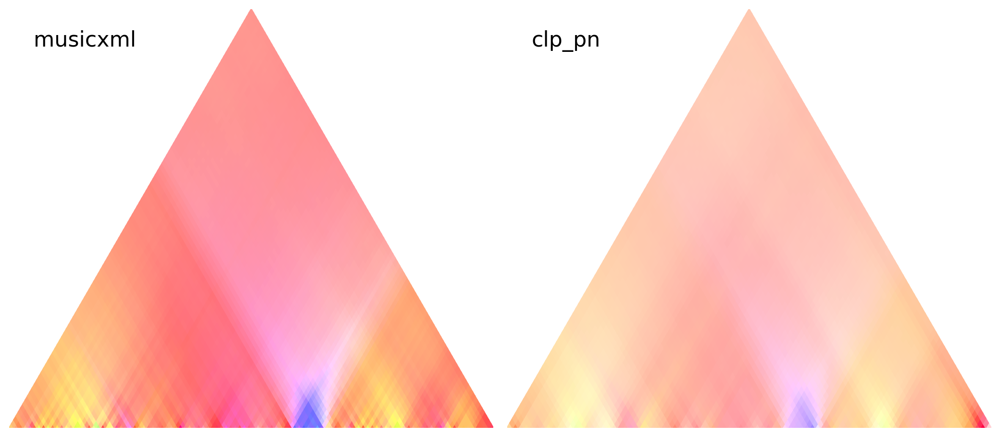

In [20]:
symbolic_vs_audio(arabesque_xml, arabesque_audio, arabesque_xml_aw,\
                  arabesque_mp3_aw, 500, 5, deep_chroma=False, pn=True)

In the end, audio processing stays a difficult problem in musicology whose solutions can feel like experimenting or even cooking. Audio processing for wavescapes is no exception, thus we recommend you to be careful when using audio files as inputs of the wavescapes library, and to try all the different options offered by the library. When applicable, you should try to have some reference information about the piece and its tonality before producing plots from an audio source. 

<a id='ticks'></a>
# 3. Horizontal and vertical indicators

### Horiztonal markers

Without horizontal markers, it can be hard to understand which section of the piece a certain color in the plot corresponds to. The parameter `aw_per_tick`, a positive integer, exists to solve this problem:


For instance, if we want each tick to represent a bar in the Prelude in C Major while knowing its time signature is 4/4, and considering the default analysis window of one quarter note, `aw_per_tick` with a value of 4 draws one tick per bar of the Prelude:

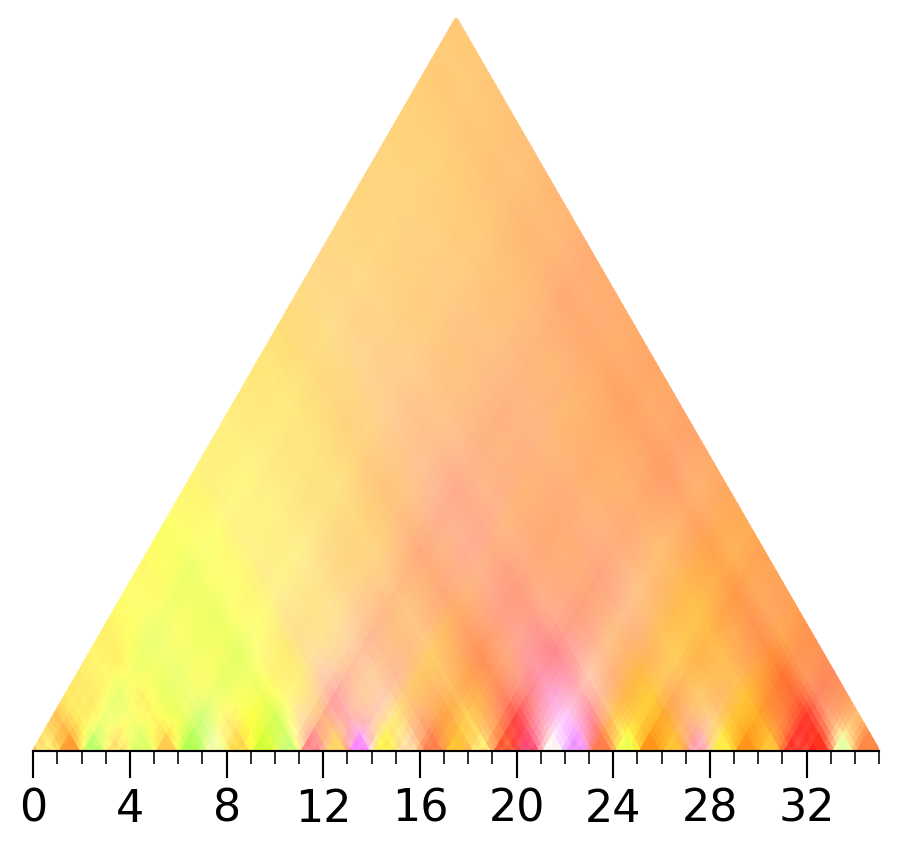

In [21]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5, aw_per_tick=4)

`tick_start` is a parameter that represents at which number the ticks should begin, by default it is set to `0` as seen above. If we want to number the ticks in the same order as the bar numbers from the score, `tick_start` should hold the value `1`:

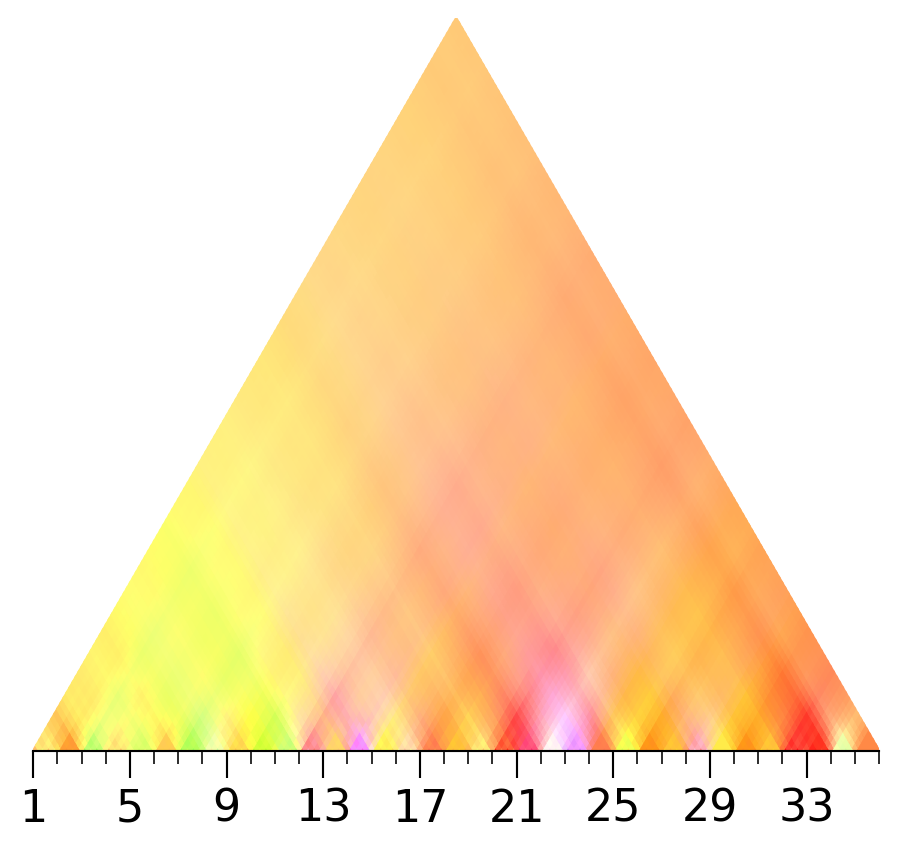

In [22]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5, aw_per_tick=4, tick_start=1)

`tick_offset` is a positive integer which ranges from 0 to `aw_per_tick` and indicates how much segements of `aw_size` length have to be offset before the first tick is drawn. This allows to correctly number the ticks on pieces that have "pick-up bars" or "anacruses", (i.e. notes played before the start of the first bar):

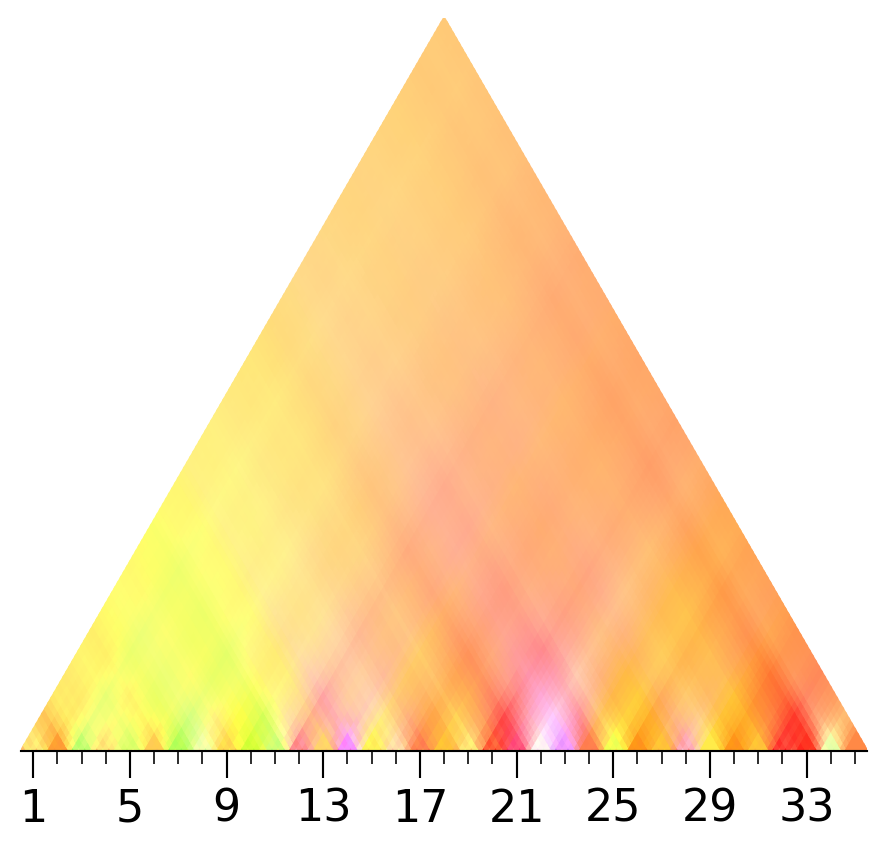

In [23]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5, aw_per_tick=4, tick_start=1, tick_offset=2)

A third parameter, `tick_factor`, a positive float whose default value is 1.0, serves as a way to _factor_ the number displayed below the _ticks_. Let's say we want to have one tick per quarter note on the Prelude, by setting `aw_per_tick` and `aw_size` both to one:

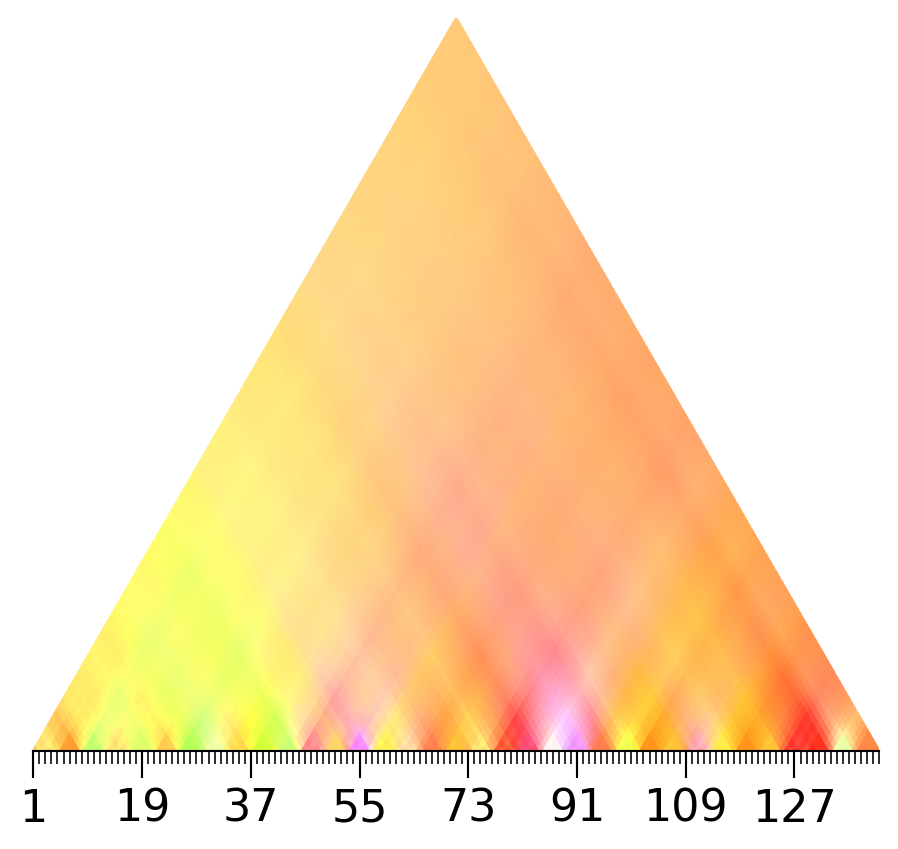

In [24]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5, aw_size=1, aw_per_tick=1, tick_start=1)

The ticks there represent the number of quarter notes, however, what if we want the numbers to still represent bar numbers, not quarter notes number? This can be achieved in this case by setting `tick_factor` to 0.25 (i.e. 1/4) to scale the number displayed on the ticks by one fourth:

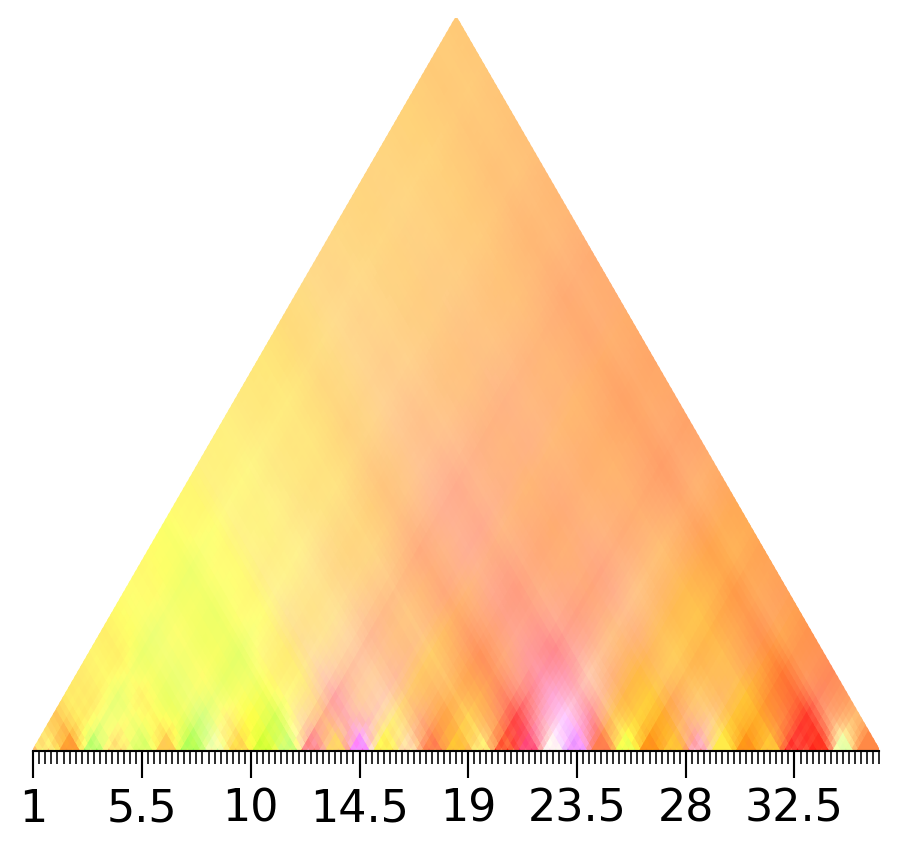

In [25]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5,\
                          aw_size=1, aw_per_tick=1, tick_start=1, tick_factor=0.25)

Finally, note that the parameter `label_size` also serves as defining the size of the tick numbers:

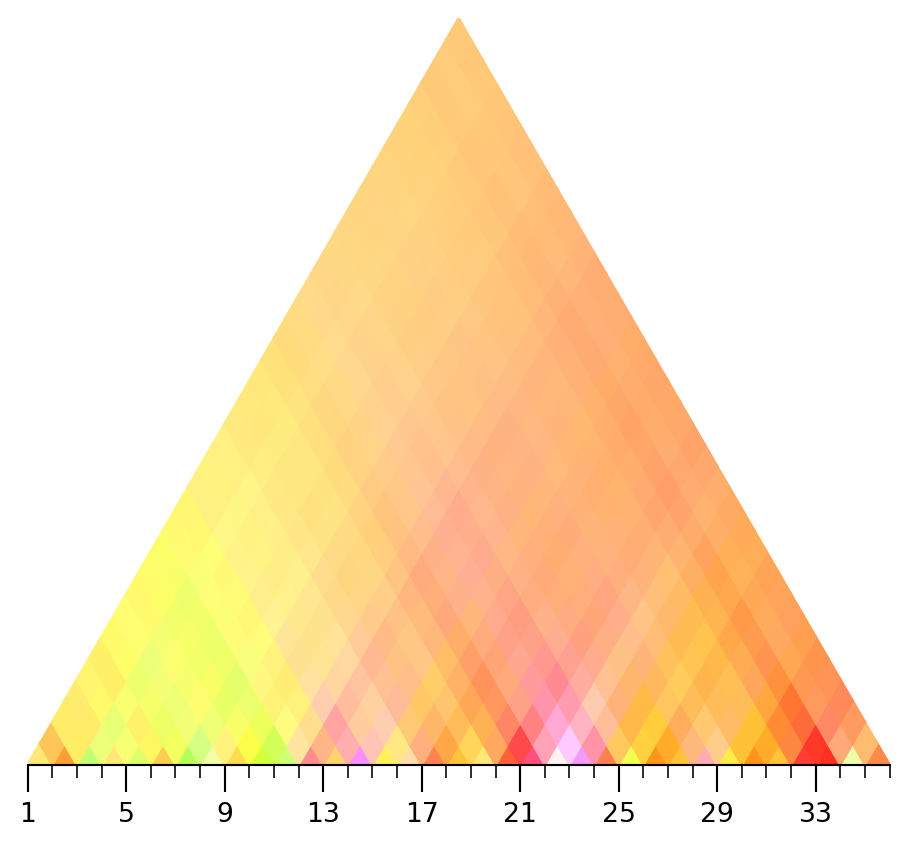

In [26]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5,\
                          aw_size=4, aw_per_tick=1, tick_start=1, label_size=10)

### Vertical markers

The parameter `indicator_size`, a positive float, triggers the apparition of vertical markers on each side of the wavescape. The recommended value is 1.0, and represents the relative size of 7 rounded indicators that are put on each side of the wavescape. They are placed at each eight subdivision of the length of the side of the wavescape: 

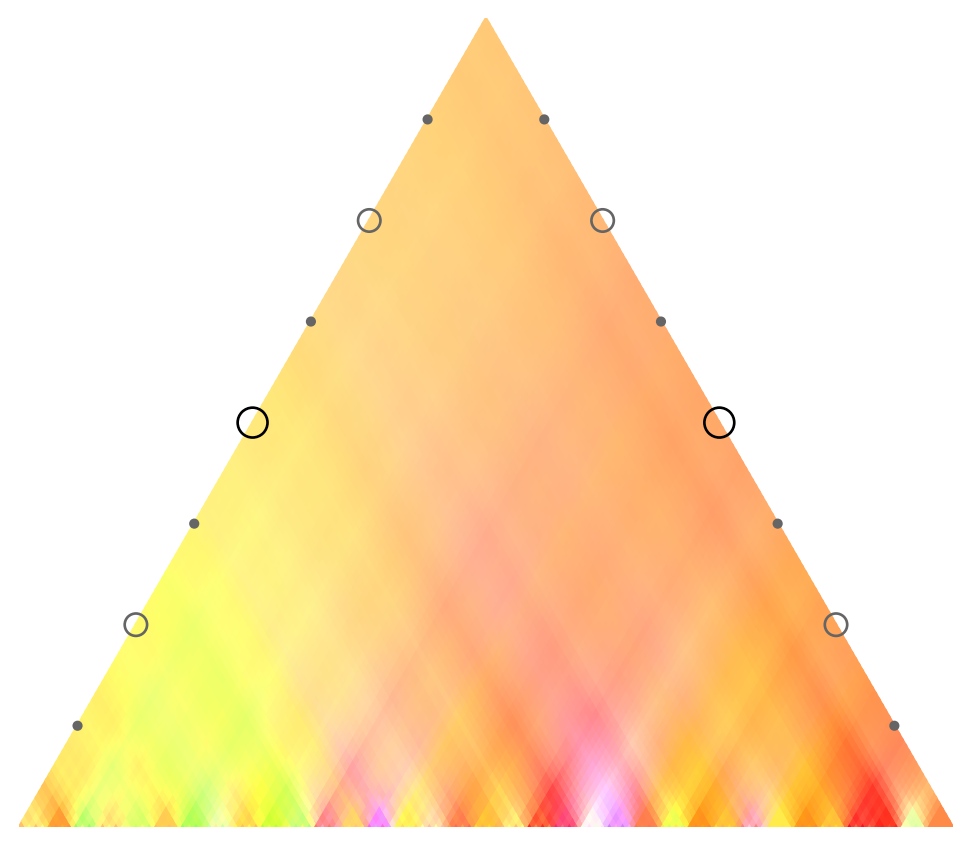

In [27]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5, indicator_size=1.0)

Decreasing (resp. increasing) the value of `indicator_size` decreases (resp. increases) the relative radius of each of those indicator:

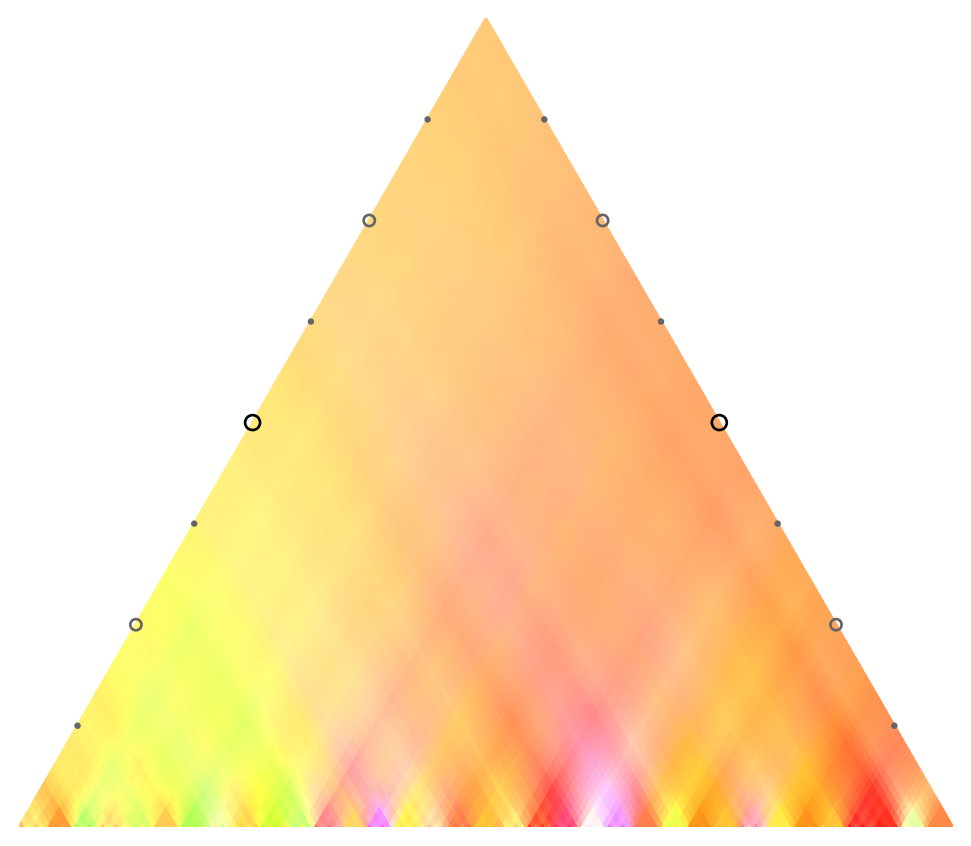

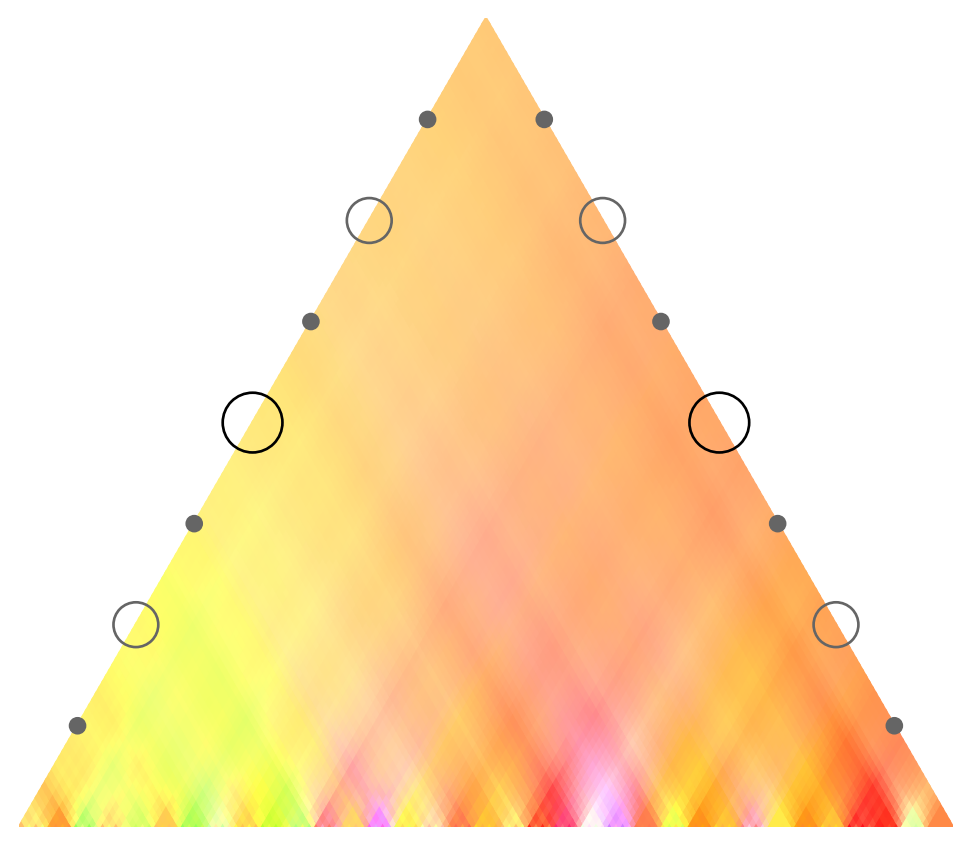

In [28]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5, indicator_size=0.5)
single_wavescape(bach_prelude_fp, width=500, coefficient=5, indicator_size=2)

<a id='highlights'></a>
# 4. Highlights & partitioning

### Producing "subwavescapes" (zoom-in)

Sometimes it can be useful to "zoom in" on a particular part of the wavescape in order to more easily see all the individual colors. The parameter `subparts_highlighted` exists partly for this purpose. It expects a list of size 2 or a tuple of integers representing the zoomed window's onset and offset index. It can also accept a list of such (onset, offset) pairs. 

For instance, let's say we want to observe more closely the region from bar 19 to 24, as it is the only part of the wavescape that features white. If we keep the analysis window size to one quarter note, that means we want to observe the sub region from the 72th (`(19-1)* 4`) segment to the 96th, thus the value `[72, 96]` can be given to `subparts_highlighted` for zooming in on this particular _subpart_ of the piece:

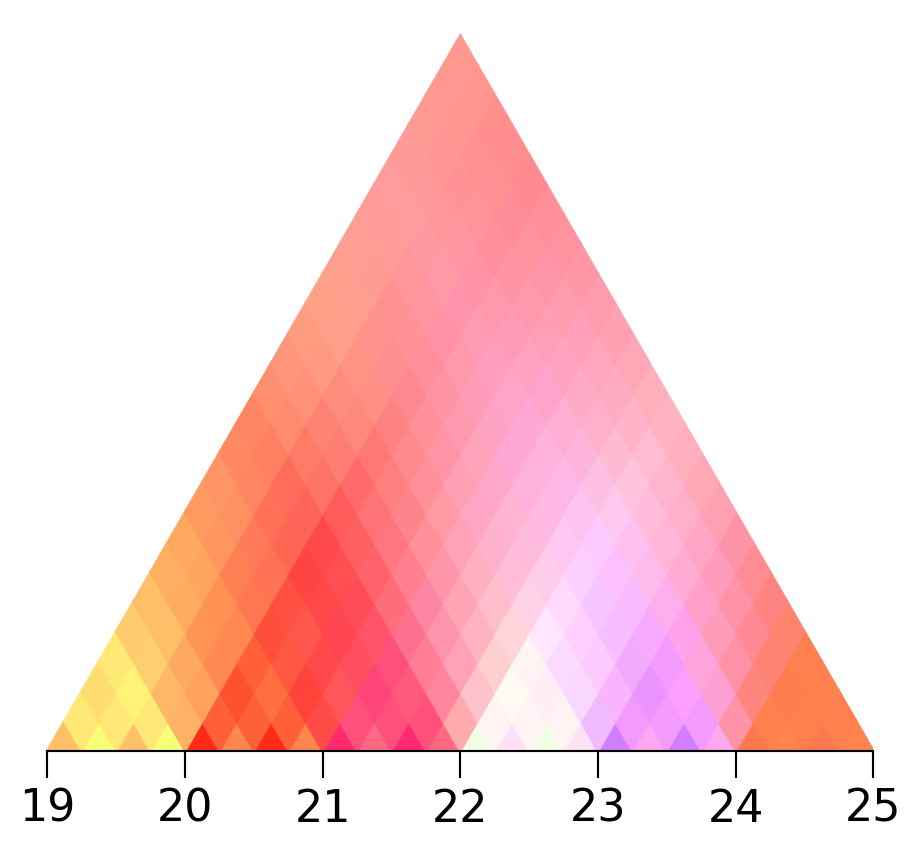

In [29]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5,\
                          aw_per_tick=4, tick_start=1, subparts_highlighted=[72,96])

As can be seen, if the parameters relating to the ticks are provided, they stay consistent with the zoom-in. However, note that the vertical indicators for the hierarchical level are not displayed through this feature.

### Drawing multiples highlights on wavescapes

The parameter `subparts_highlighted` also accepts a list of regions (still in onset-offset tuple fashion) and displays highlights over those regions by the means of black outlines. For instance, let's highlight the region on which we just zoomed in and the first two bars of the Prelude by providing the value `[[0,8], [72,96]]` to the parameter:

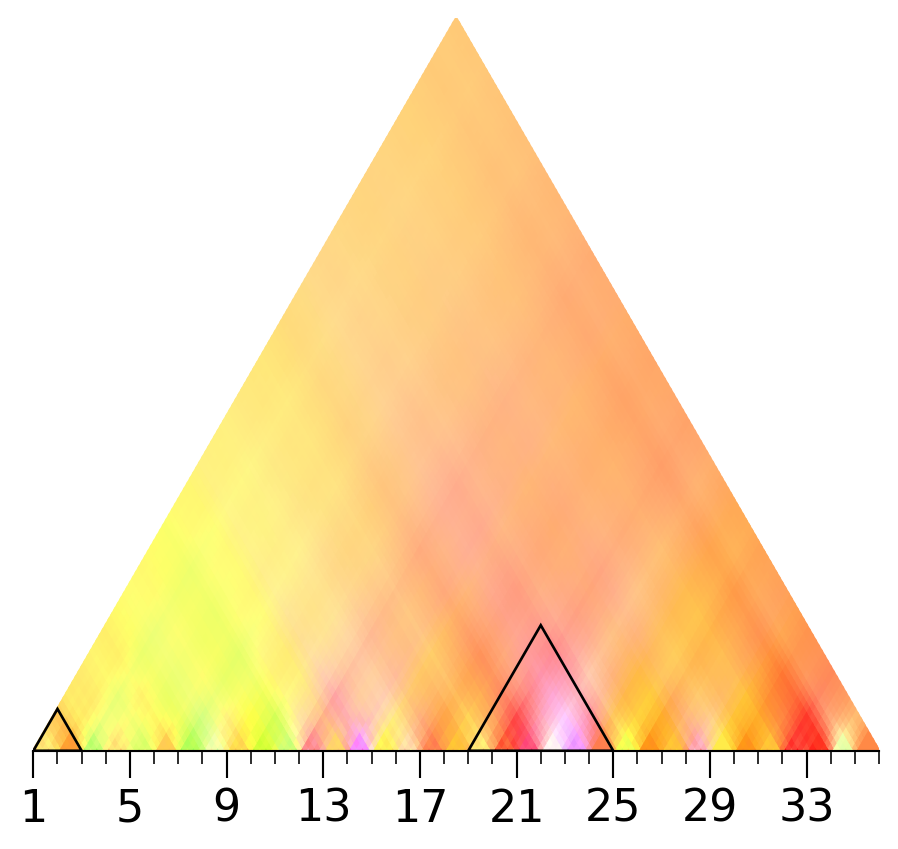

In [30]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5,\
                          aw_per_tick=4, tick_start=1, subparts_highlighted=[[0,8],[72,96]])

This list can hold as many tuples as wanted, and the zones they represent can overlap without restriction:

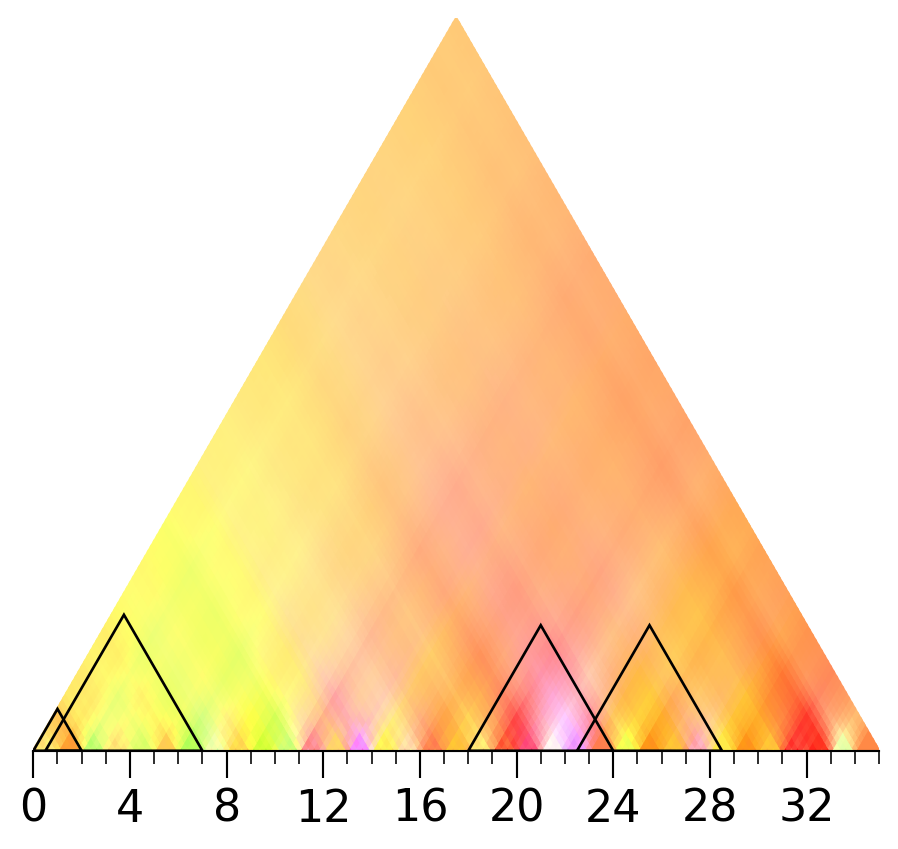

In [31]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5,\
                          aw_per_tick=4, tick_offset=0, subparts_highlighted=[[0,8],[72,96],[2,28],[90,114]])

<a id='cosmetic'></a>
# 5. Cosmetic changes

Some parameters in the functions provided by this library exist purely for cosmetic reasons, without bringing any analytical insight: 

### Adding outlines

`add_line`, as its name indicates, adds an outline on all the elements (often called 'primitive' here) of the wavescape. It expects a positive float/integer, and represents the width of the outline to be drawn.


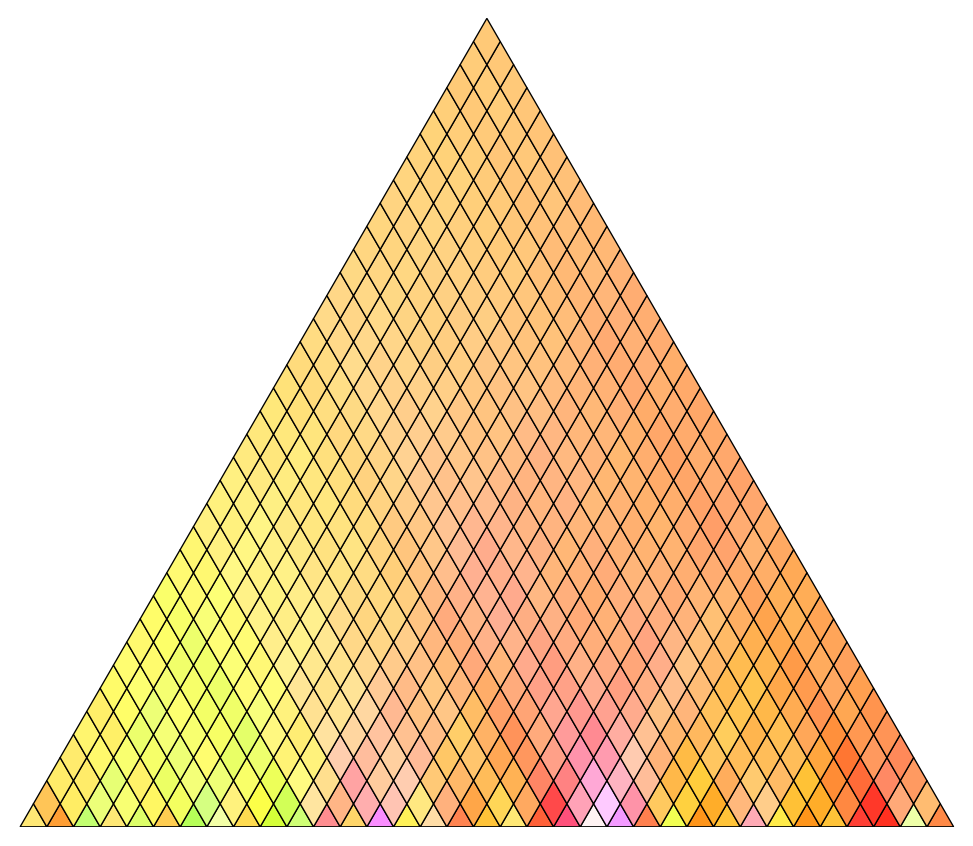

In [32]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5,\
                          aw_size=4, add_line=0.5)

### Changing primitives

`primitive` dictates what shape each elements of the wavescape is drawn in. Three values are supported:

1. 'rhombus': default value, represent a diamond that is formed by the union of two equilateral triangles. Makes the whole wavescape plot into the shape of an equilateral triangle.

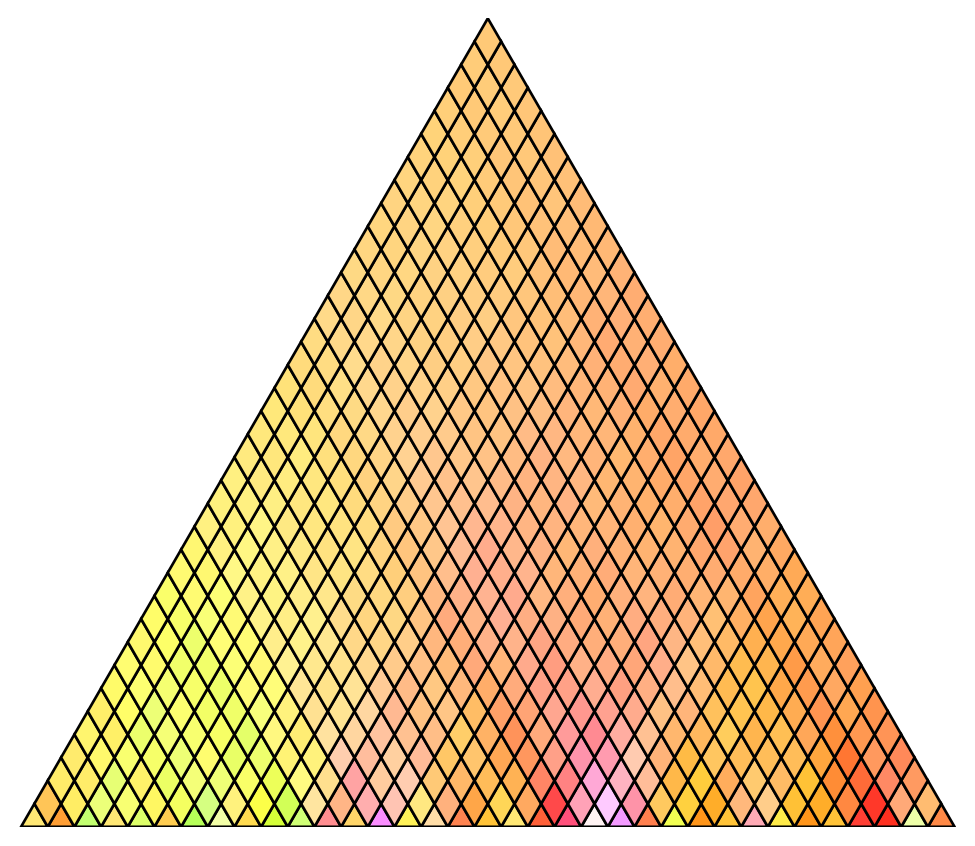

In [33]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5,\
                          aw_size=4, primitive='rhombus', add_line=1)

2. 'diamond': represent a diamond that is twice as tall as it is wide. Can be useful to give more visual weight to the vertical hierarchy of the plot.

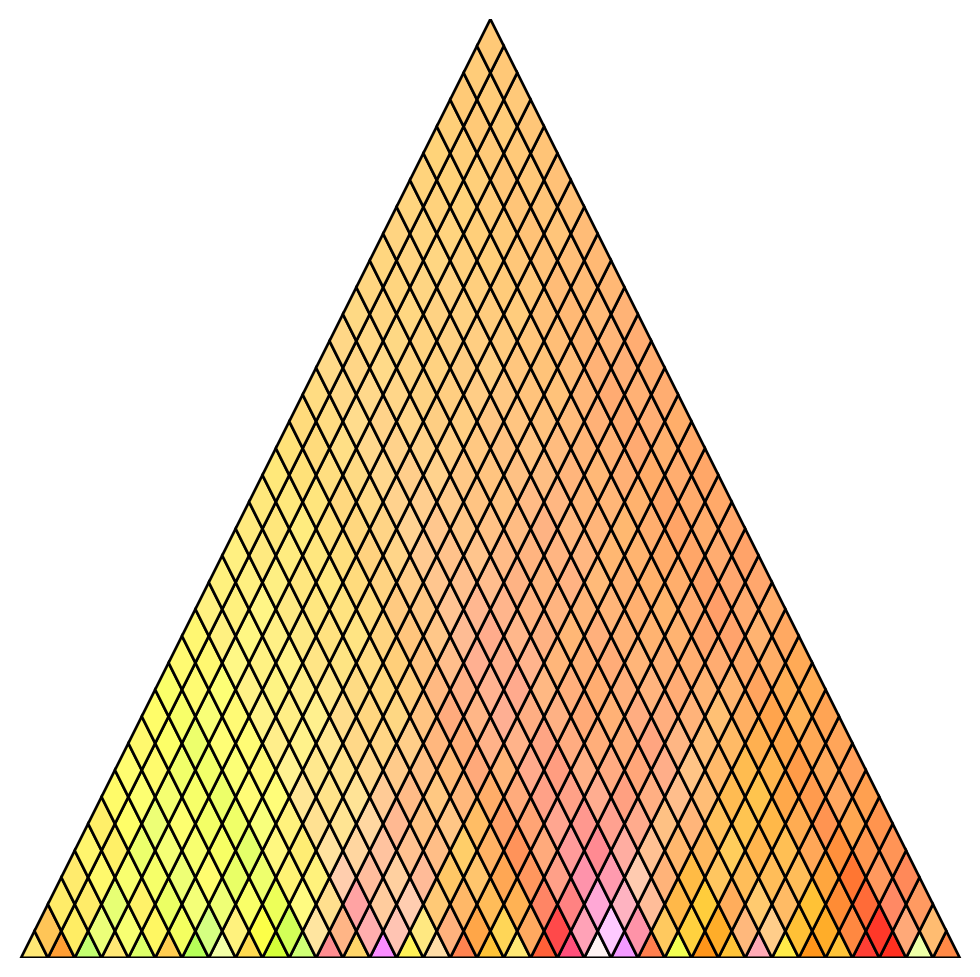

In [34]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5,\
                          aw_size=4, primitive='diamond', add_line=1)

3. 'hexagon': pretty self-explanatory, the shape of the hexagon allow individual colors from the rows to be more easily observable.

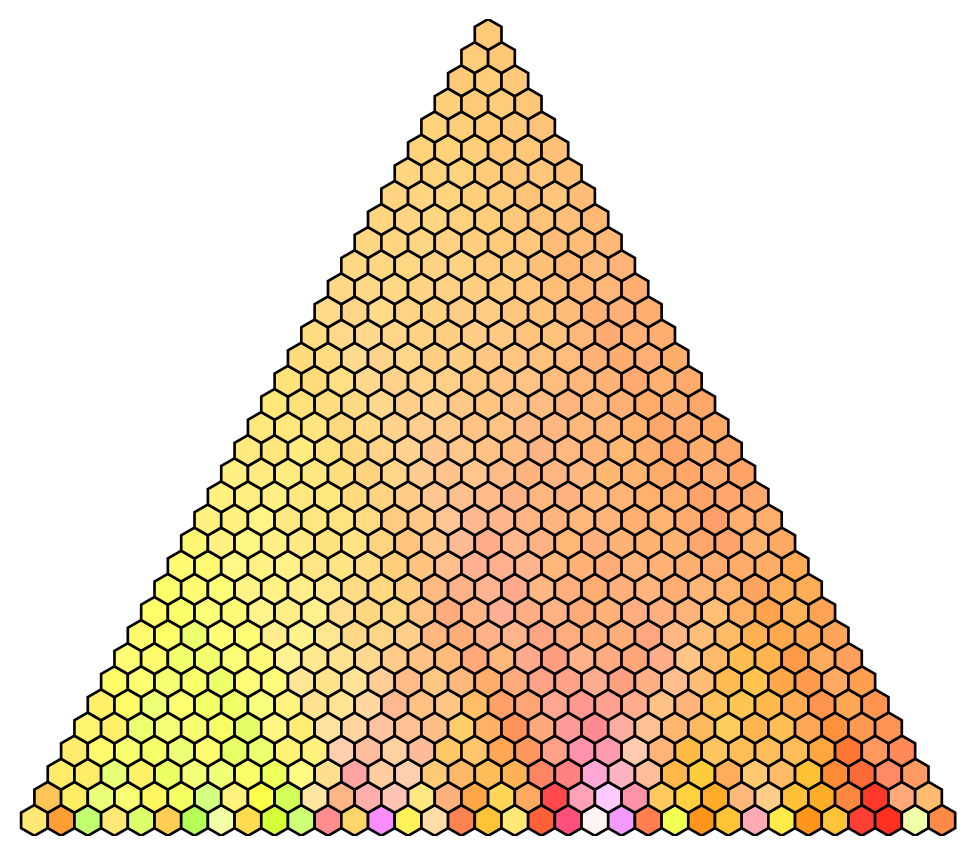

In [35]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5,\
                          aw_size=4, primitive='hexagon', add_line=1)

### 'True' opacity

The boolean parameter `output_rgba`, indicates whether the resulting image is in RGBA, or RGB format. By default it is set to `False`, meaning the function hardcode a white background for the opacity mapping to be expressed in RGB format during the production of colors. If set to `True`, then the resulting image is in RGBA format meaning the opacity is directly mapped to the alpha channel, achieving a "True opacity".

However because of how matplotlib rasterizes polygons, seams appear between the primitives in RGBA mode, even without using the `add_line` parameter. To demonstrate this parameter and the seams produced, here is a code snippet showcasing a wavescape in RGBA mode on a black background: 

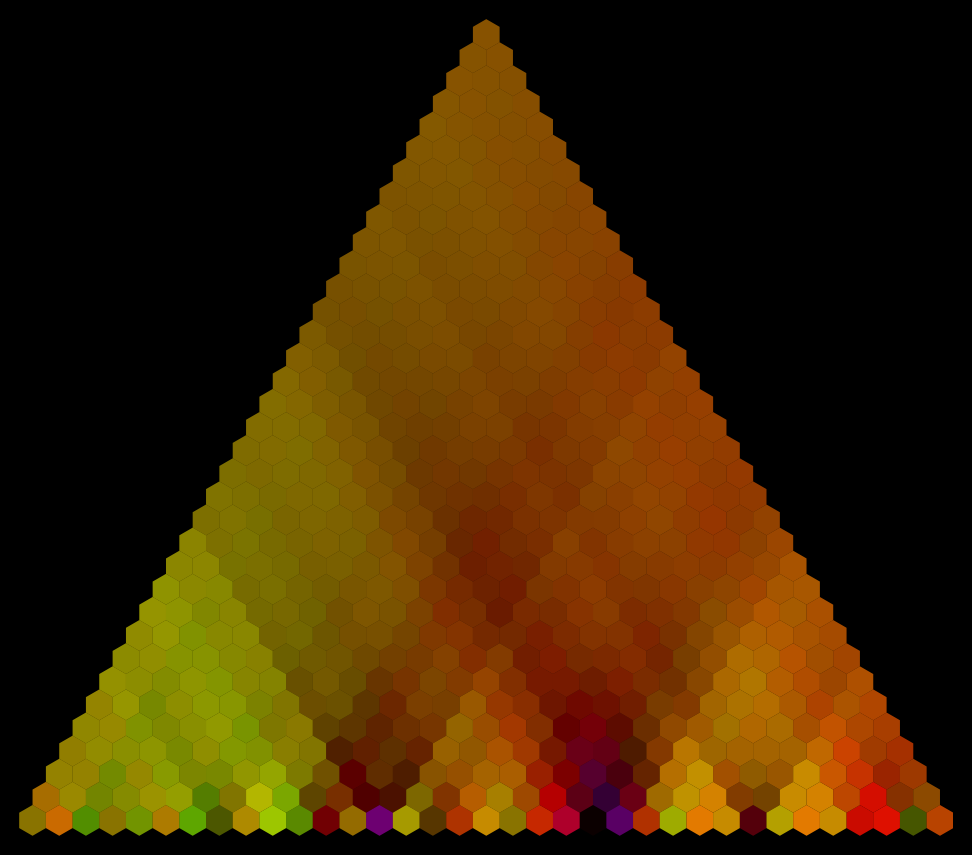

In [36]:
import matplotlib.pyplot as plt
plt.rcParams['figure.facecolor'] = 'black'
single_wavescape(bach_prelude_fp, width=500, coefficient=5,\
                          aw_size=4, primitive='hexagon', output_rgba=True)

#reset it to the default background
plt.rcParams['figure.facecolor'] = 'white'

Increasing the width in pixels (`width`) can mitigate those seams, but we recommend 'embracing' the seams by enabling the `add_line` parameter.

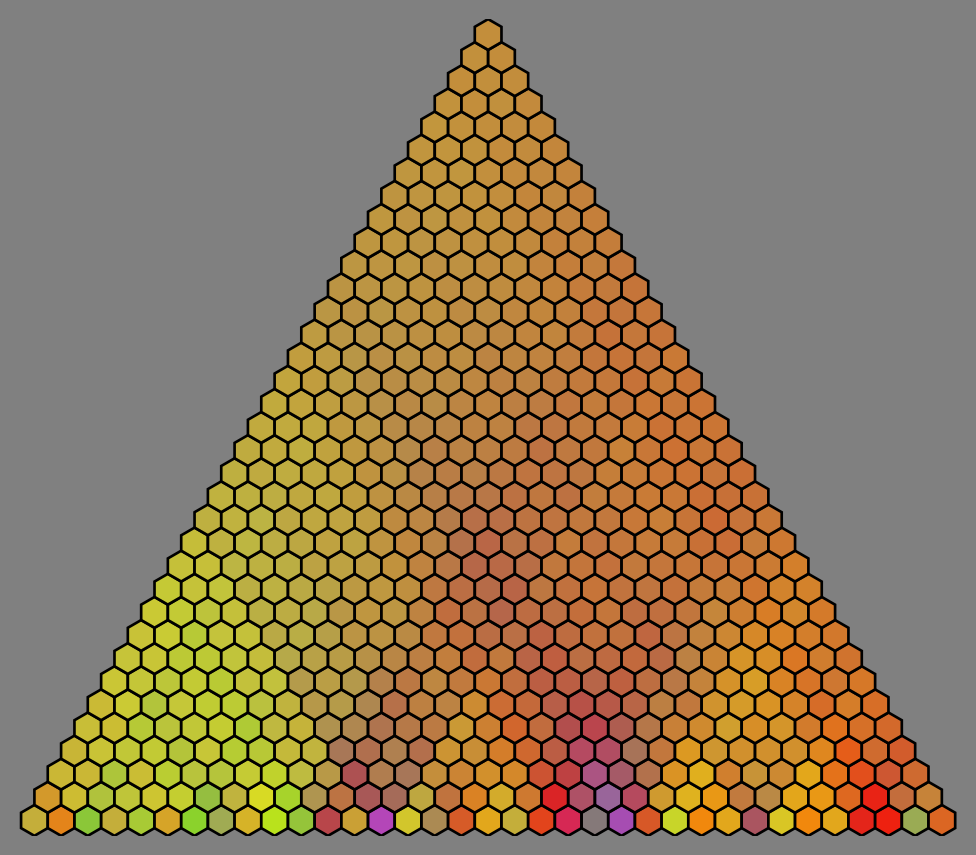

In [37]:
plt.rcParams['figure.facecolor'] = 'gray'
single_wavescape(bach_prelude_fp, width=500, coefficient=5,\
                          aw_size=4, primitive='hexagon', output_rgba=True, add_line=1)

#reset it to the default background
plt.rcParams['figure.facecolor'] = 'white'

Note that if you wish to locally save a plot with RGBA values, the `transparent` parameter of the `matplotlib.pyplot.savefig` function needs to be set to `True`. If the `save_label` parameter is used, the function `single_wavescape` takes care of that internally.

<a id='other'></a>
# 6. Other parameters

### Adding a wavescape as subplots

As the `single_wavescape` uses `matplotlib` for drawing wavescapes, a `maplotlib.pyplot.figure` object can be given through the `ax` parameter in order to build wavescapes in subplots of any other matplotlib figures. Below is an example figure building a histogram of pitch-class distribution in the whole Prelude next to the wavescape of its fifth coefficient:

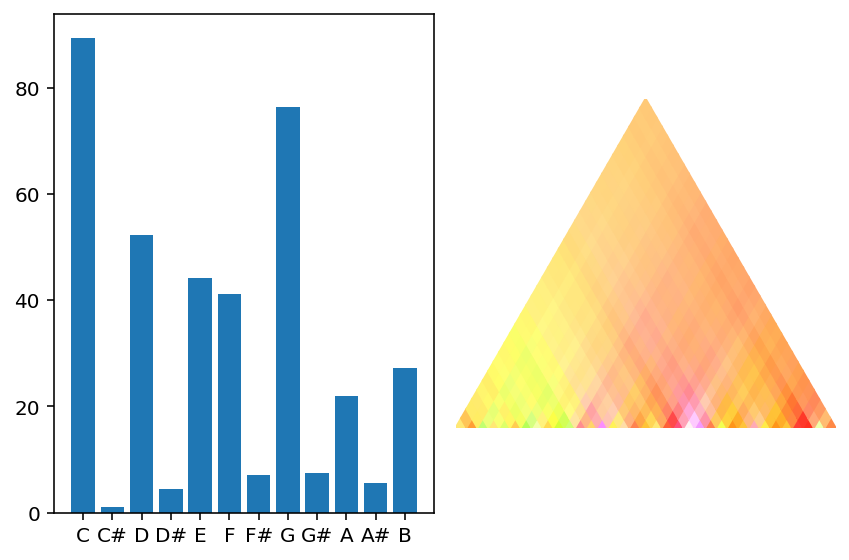

In [38]:
bach_prelude_pcd_y = [89.5, 1., 52.25, 4.5, 44.25, 41.25, 7., 76.5, 7.5, 22., 5.5, 27.25]
pcd_labels = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
bach_prelude_pcd_x = [i for i in range(len(pcd_labels))]


fig = plt.figure()
ax1 = fig.add_subplot(1,2,1)
ax1.bar(pcd_labels, bach_prelude_pcd_y)
ax2 = fig.add_subplot(1,2,2, aspect='equal')
single_wavescape(bach_prelude_fp, aw_size=4, coefficient=5, width=700, ax=ax2)

Note that in order to preserve the wavescape proportions without having the hassle to calculate specific height and width of the whole figure, the option `aspect='equal'` of the `subplot` method call should be set.

### Trimming silences

In order to showcase the effect of the next two parameters, a new input file is required. This file is called 'Silences & Percussions' and is a very short score of 5 measures produced for the purpose of this tutorial. It contains two parts, a simple melody on the xylophone, and a basic drum beat. You can open up the file located in that path to check it out:

In [39]:
silence_percu_example_fp = 'inputs/Silences & Percussions.musicxml'

The xylophone part plays note of the C augmented triad on the second bar, and notes of the F augmented triad on the fourth bar. Thus looking at this example through the wavescape of the 3rd coefficient should display some different bright colors for the second and fourth bar, while being white for the rest of the figure:

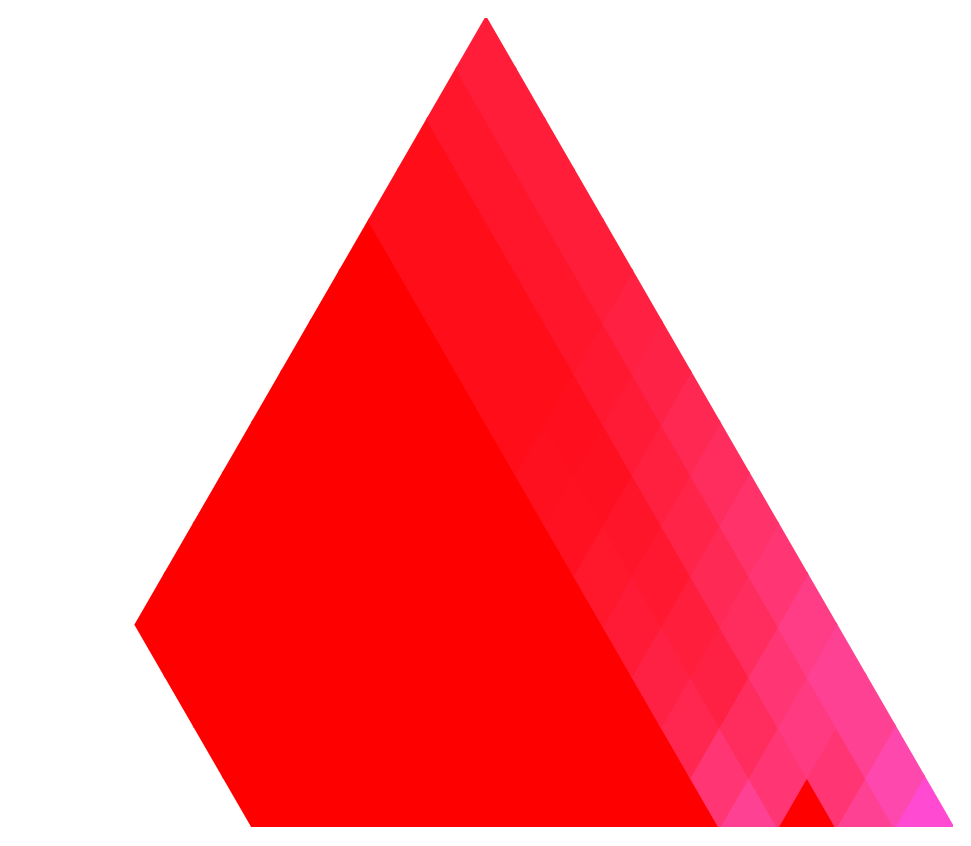

In [40]:
single_wavescape(silence_percu_example_fp, coefficient=3, aw_size=1., width=500, \
                          trim_extremities=False )

This is not really what was expected, as only one color is predominantly shown instead of two, and the left-most side of the wavescape does not bring any new information to the plot as it is purely white. As can be seen in the function call above, the parameter `trim_extremities` is set to `False`. This parameter, normally set by default to `True`, removes empty bars before the beginning and after the end of the score. As the pitch class content of such a bar is non existent, they do not change the color values from the wavescape. Here is how the wavescape looks like if that parameter is set to `True` or if the parameter is not enabled:

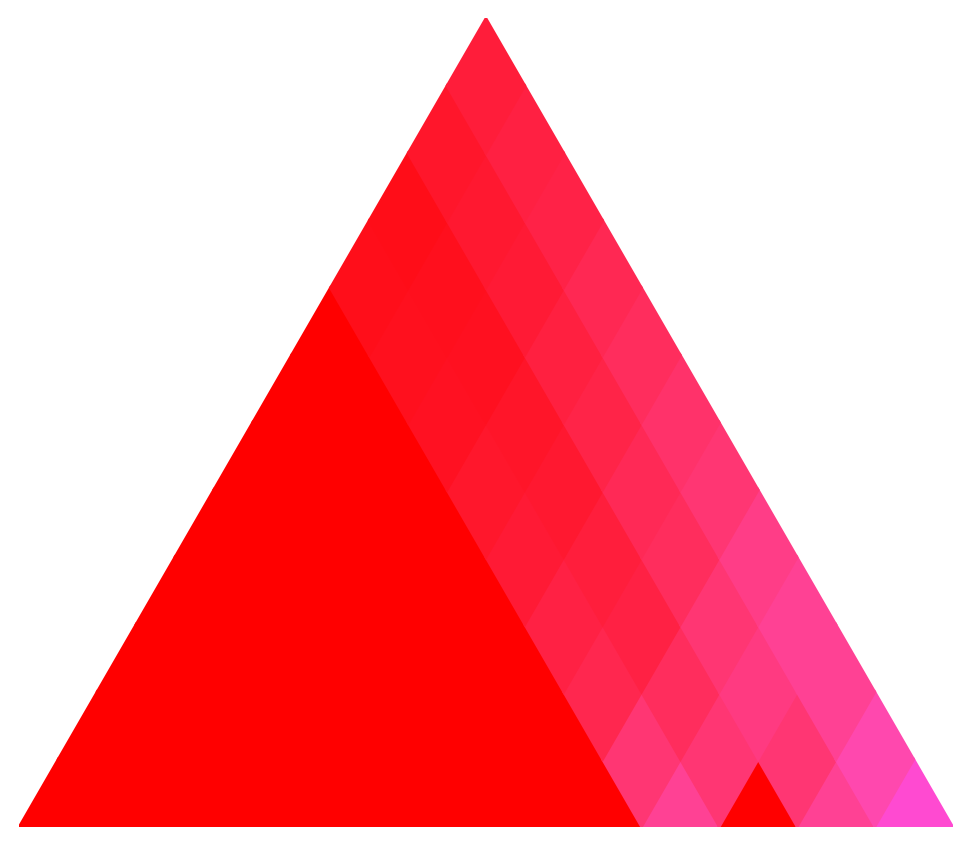

In [41]:
single_wavescape(silence_percu_example_fp, coefficient=3, aw_size=1., \
                          width=500, trim_extremities=True )

This is better, however, the middle part displays a bright red color although the only pitched instrument, the xylophone does not play during that bar. All notes of the drum part are defaulted to the pitch C in that piece, and thus introduces some unwanted pitch classes in the wavescape. 

### Removing unpitched tracks

The parameter `remove_unpitched_tracks`, a boolean with default value `False`, can be set to `True` in order to filter out all tracks or parts from the input file that do not feature pitched notes:

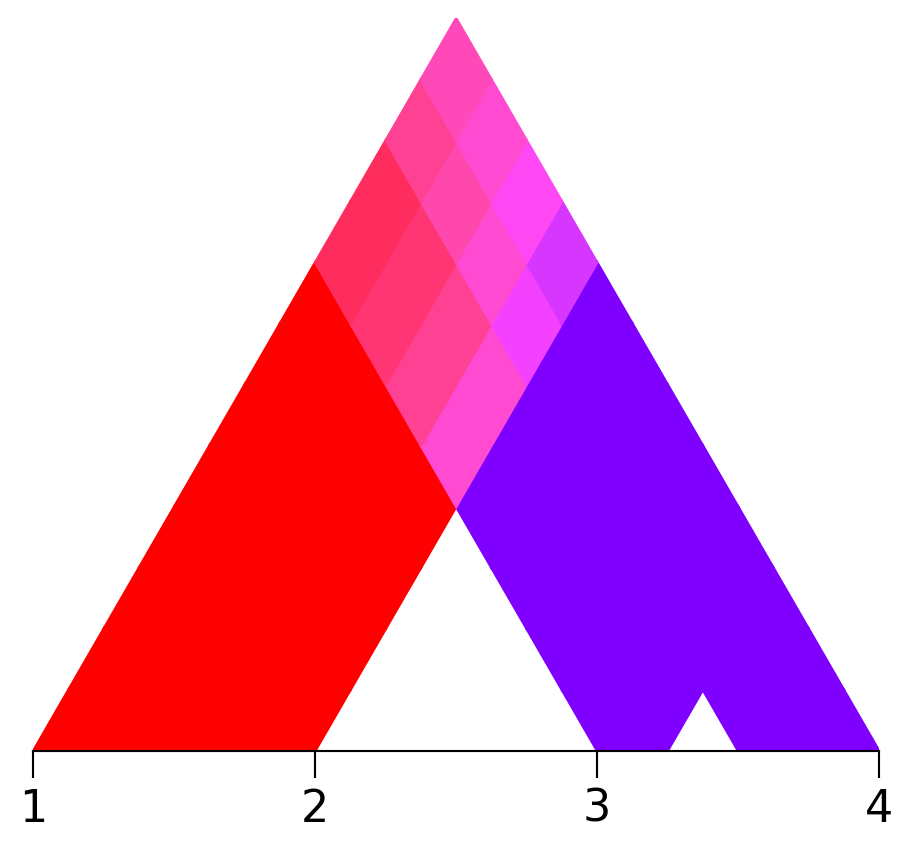

In [42]:
single_wavescape(silence_percu_example_fp, coefficient=3, aw_size=1., \
                          width=500, aw_per_tick=4, tick_start=1, trim_extremities=True,
                          remove_unpitched_tracks=True)

### Conserve only the hue (phase)
If for some reasons, you want to only observe the phase/hue mapping, the opacity mapping can be disabled independently from the hue by setting the parameter `ignore_magnitude` to `True`:

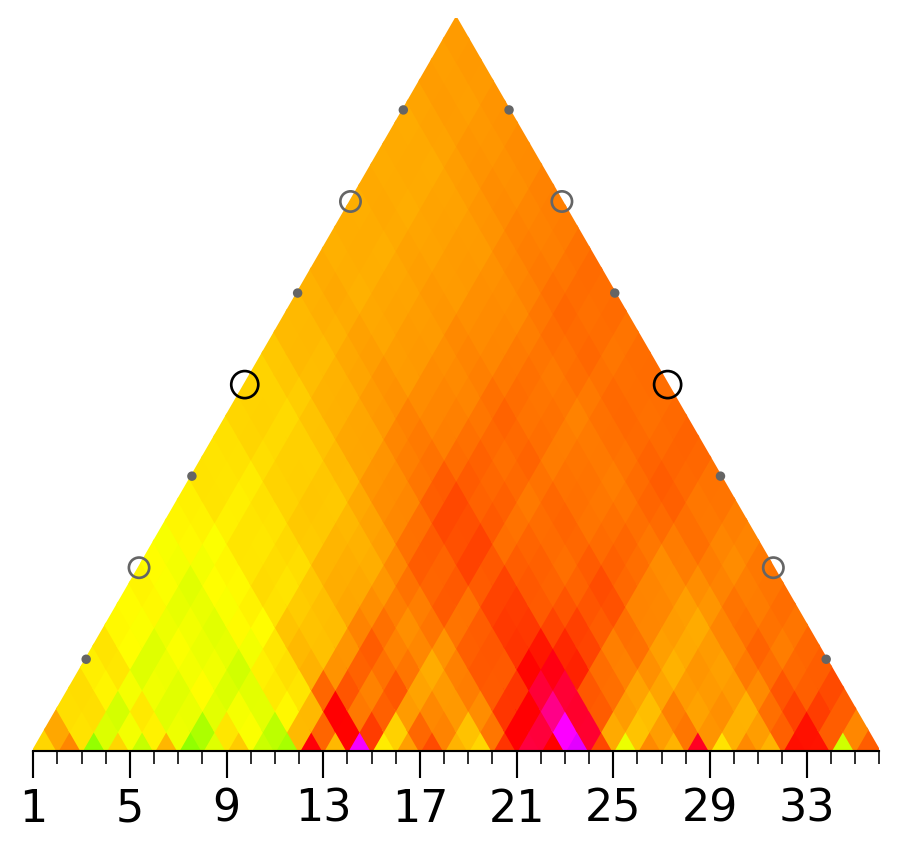

In [43]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5,\
                          aw_size=4, aw_per_tick=1, tick_start=1, ignore_magnitude=True, indicator_size=1.0)

The same parameter can be used for `legend_decomposition` to remove the magnitude from the legends:

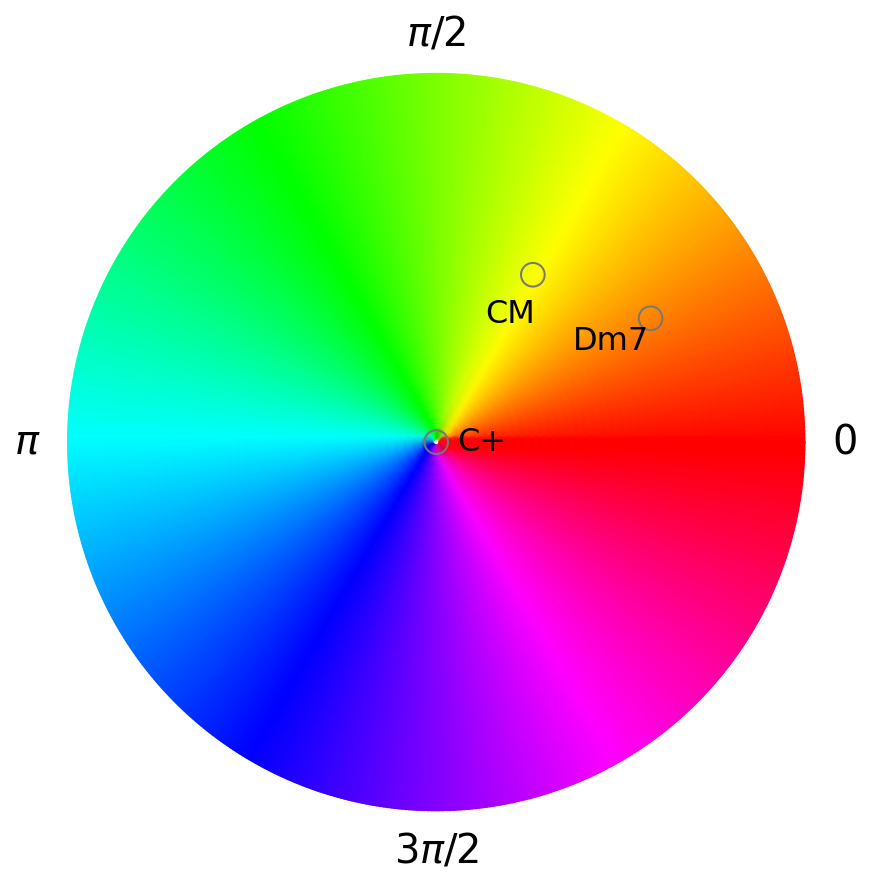

In [44]:
d = {'C+': ([1,0,0,0,1,0,0,0,1,0,0,0], [0]),
     'Dm7': ([1,0,1,0,0,1,0,0,0,1,0,0], [0]),
     'CM': ([1,0,1,0,1,1,0,1,0,1,0,1], [5])}
legend_decomposition(d, single_img_coeff=5, width=7, ignore_magnitude=True)

### Conserve only the opacity (magnitude)

Similarly, if you want to only observe the magnitude mapping in the wavescapes, you can set the parameter `ignore_phase` to `True` in either `single_wavescape` or `legend_decomposition`:

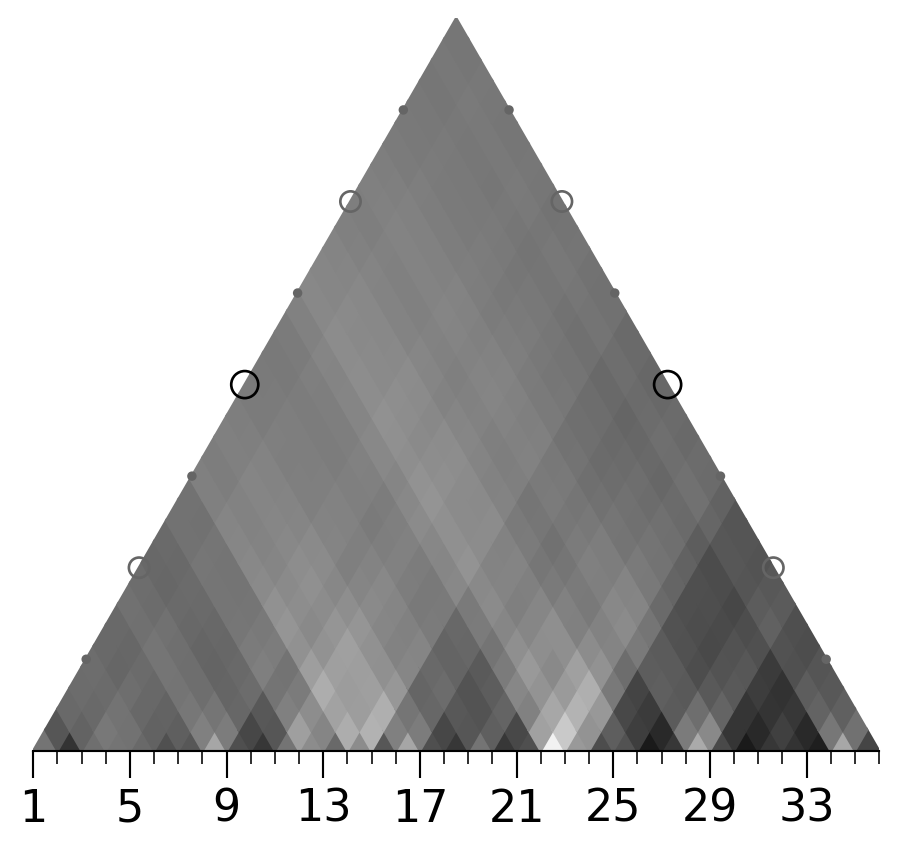

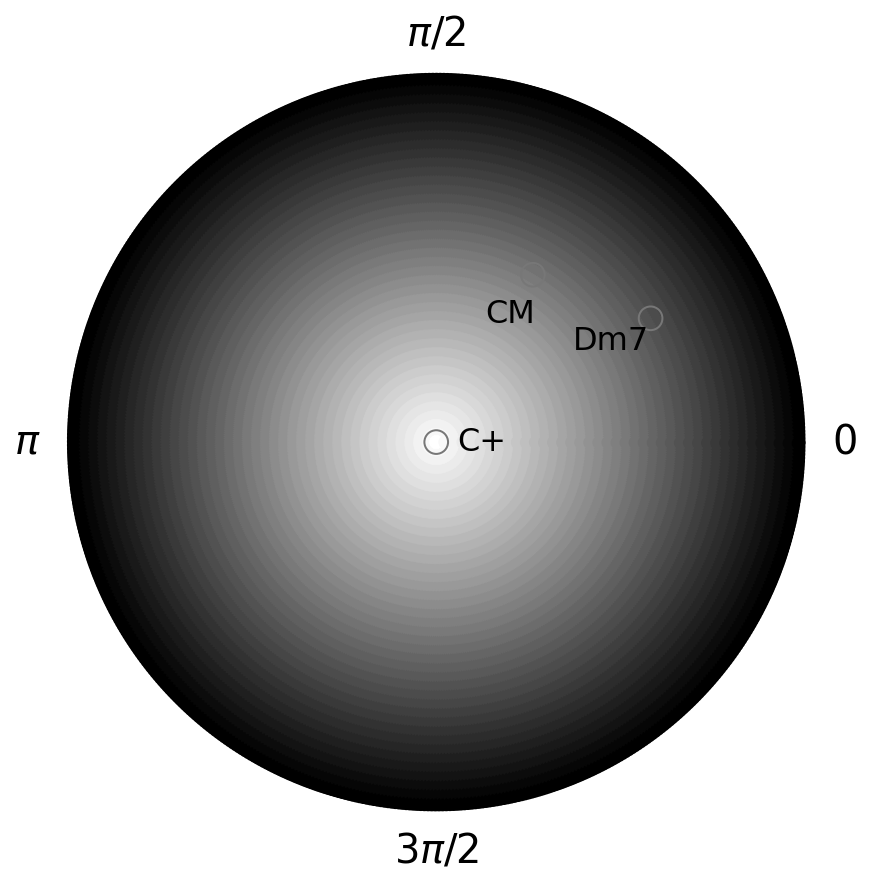

In [45]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5,\
                          aw_size=4, aw_per_tick=1, tick_start=1, ignore_phase=True, indicator_size=1.0)
legend_decomposition(d, single_img_coeff=5, width=7, ignore_phase=True)

You may combine both parameters together to remove both the hue and opacity, but why would you want to do that?

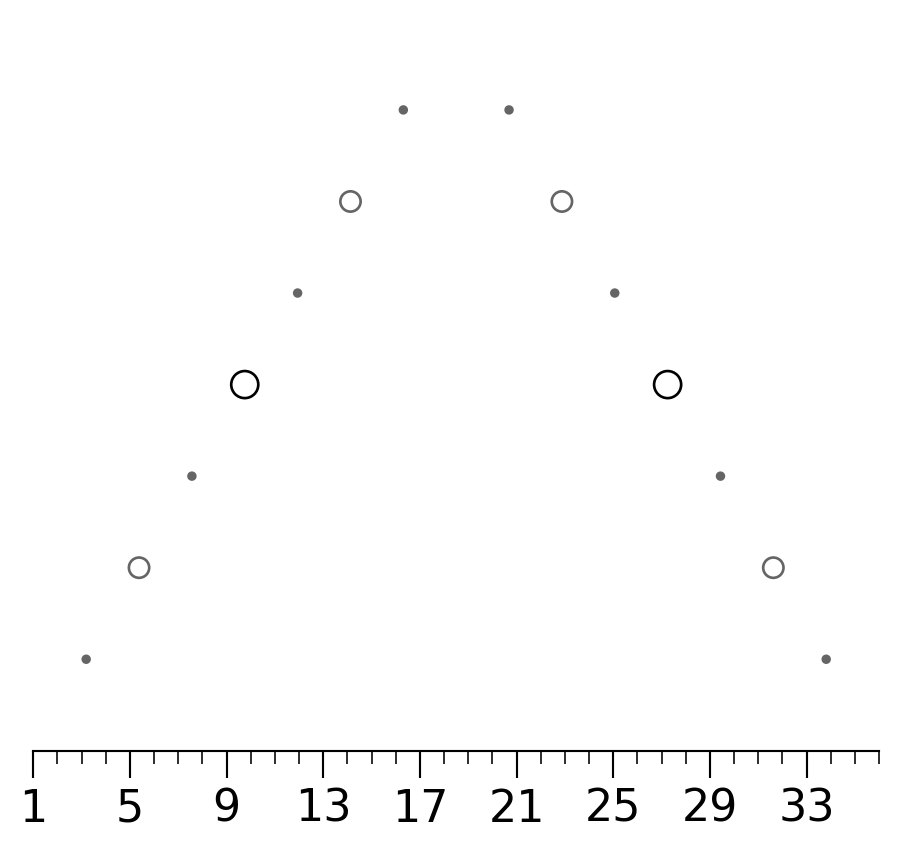

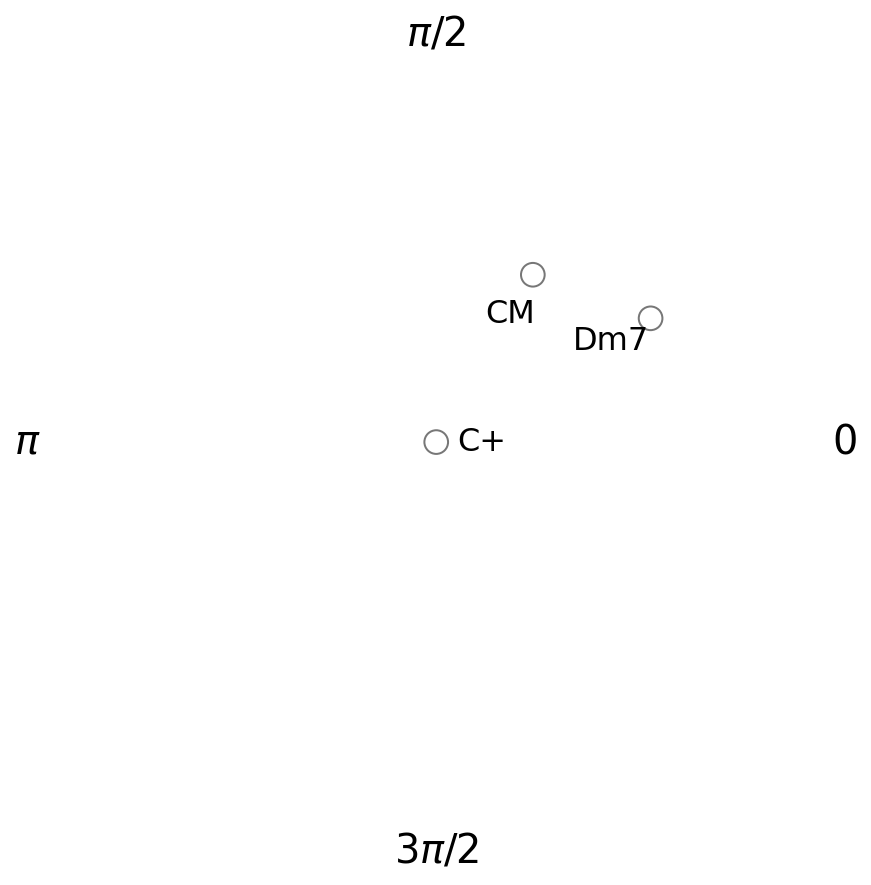

In [46]:
single_wavescape(bach_prelude_fp, width=500, coefficient=5,\
                 aw_size=4, aw_per_tick=1, tick_start=1,\
                 ignore_magnitude=True, ignore_phase=True, indicator_size=1.0)
legend_decomposition(d, single_img_coeff=5, width=7, ignore_phase=True, ignore_magnitude=True)